In [1]:
import pandas as pd
from math import isnan
import matplotlib as mpl
import numpy as np
import scipy.stats
import matplotlib.pyplot as plt
import pickle as pkl
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
mpl.rcParams['figure.dpi'] = 300

In [2]:
import sys
sys.path.append("..")
import sensei

In [3]:
import tcga_dicts
from tcga_dicts import *

# Part 0: Load Data

## Immune Cell Fractions

CIBERSORT result from [*The Immune Landscape of Cancer*](https://www.sciencedirect.com/science/article/pii/S1074761318301213) downloaded from [NIH PanCanAtlas](https://gdc.cancer.gov/about-data/publications/panimmune) includes are SampleID ([TCGA barcode](https://docs.gdc.cancer.gov/Encyclopedia/pages/TCGA_Barcode/)), Cancer Type ([TCGA Study Abbreviation](https://gdc.cancer.gov/resources-tcga-users/tcga-code-tables/tcga-study-abbreviations)), and the abundance of 22 imuune cell types.

Note that the abundances in each row sum to 1. In other words, the abundance is the proportion of a cell type in the leukocyte compartment (see [below](#lf)), but not all cells (stroma, tumor, etc.).

In [4]:
data = pd.read_csv("TCGA.Kallisto.fullIDs.cibersort.relative.tsv", sep="\t")
data["SampleID"] = data["SampleID"].apply(lambda x: x.replace('.', '-'))
data

,SampleID,CancerType,B.cells.naive,B.cells.memory,Plasma.cells,T.cells.CD8,T.cells.CD4.naive,T.cells.CD4.memory.resting,T.cells.CD4.memory.activated,T.cells.follicular.helper,...,Macrophages.M2,Dendritic.cells.resting,Dendritic.cells.activated,Mast.cells.resting,Mast.cells.activated,Eosinophils,Neutrophils,P.value,Correlation,RMSE
0,TCGA-OR-A5JG-01A-11R-A29S-07,ACC,0.000000,0.048529,0.016052,0.046099,0.027037,0.290682,0.0,0.000000,...,0.363861,0.002715,0.026125,0.032788,0.000000,0.010290,0.009607,0.112,0.095797,1.047142
1,TCGA-OR-A5LG-01A-11R-A29S-07,ACC,0.007169,0.011125,0.007982,0.139842,0.000000,0.142742,0.0,0.001614,...,0.448243,0.000000,0.007464,0.126237,0.000000,0.000000,0.000000,0.104,0.103345,1.046163
2,TCGA-OR-A5JD-01A-11R-A29S-07,ACC,0.000023,0.014607,0.000000,0.104888,0.000000,0.174895,0.0,0.017928,...,0.329552,0.000000,0.009330,0.000000,0.190730,0.000000,0.000000,0.068,0.143259,1.039812
3,TCGA-OR-A5LH-01A-11R-A29S-07,ACC,0.047299,0.038180,0.000000,0.198591,0.000000,0.065240,0.0,0.043310,...,0.287939,0.000000,0.000576,0.000000,0.064725,0.000000,0.000000,0.388,0.028763,1.080553
4,TCGA-OR-A5KY-01A-11R-A29S-07,ACC,0.000000,0.024795,0.004418,0.051506,0.000000,0.225892,0.0,0.000000,...,0.486400,0.000000,0.042827,0.000000,0.017418,0.014769,0.000000,0.246,0.055621,1.073474
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11368,TCGA-V4-A9EQ-01A-11R-A405-07,UVM,0.000000,0.028939,0.008894,0.000000,0.023294,0.015676,0.0,0.002279,...,0.521353,0.009128,0.000000,0.208036,0.000000,0.000000,0.000000,0.090,0.111538,1.060529
11369,TCGA-V4-A9EV-01A-11R-A405-07,UVM,0.000000,0.013299,0.025069,0.315356,0.000000,0.017361,0.0,0.095233,...,0.163671,0.015558,0.000000,0.061707,0.000000,0.000000,0.000000,0.002,0.347125,0.952021
11370,TCGA-V4-A9EY-01A-11R-A405-07,UVM,0.000000,0.032507,0.076160,0.061400,0.034359,0.000000,0.0,0.007778,...,0.431568,0.004550,0.000000,0.227797,0.000000,0.000000,0.000000,0.086,0.113888,1.041876
11371,TCGA-V4-A9EU-01A-11R-A405-07,UVM,0.000000,0.021228,0.010225,0.067985,0.003434,0.006675,0.0,0.004884,...,0.627631,0.000000,0.000000,0.147489,0.000000,0.000000,0.000000,0.096,0.107852,1.068155


In [5]:
tcga_study_abbr_dict = {
    "LAML": "Acute Myeloid Leukemia",
    "ACC": "Adrenocortical carcinoma",
    "BLCA": "Bladder Urothelial Carcinoma",
    "LGG": "Brain Lower Grade Glioma",
    "BRCA": "Breast invasive carcinoma",
    "CESC": "Cervical squamous cell carcinoma and endocervical adenocarcinoma",
    "CHOL": "Cholangiocarcinoma",
    "LCML": "Chronic Myelogenous Leukemia",
    "COAD": "Colon adenocarcinoma",
    "CNTL": "Controls",
    "ESCA": "Esophageal carcinoma",
    "FPPP": "FFPE Pilot Phase II",
    "GBM": "Glioblastoma multiforme",
    "HNSC": "Head and Neck squamous cell carcinoma",
    "KICH": "Kidney Chromophobe",
    "KIRC": "Kidney renal clear cell carcinoma",
    "KIRP": "Kidney renal papillary cell carcinoma",
    "LIHC": "Liver hepatocellular carcinoma",
    "LUAD": "Lung adenocarcinoma",
    "LUSC": "Lung squamous cell carcinoma",
    "DLBC": "Lymphoid Neoplasm Diffuse Large B-cell Lymphoma",
    "MESO": "Mesothelioma",
    "MISC": "Miscellaneous",
    "OV": "Ovarian serous cystadenocarcinoma",
    "PAAD": "Pancreatic adenocarcinoma",
    "PCPG": "Pheochromocytoma and Paraganglioma",
    "PRAD": "Prostate adenocarcinoma",
    "READ": "Rectum adenocarcinoma",
    "SARC": "Sarcoma",
    "SKCM": "Skin Cutaneous Melanoma",
    "STAD": "Stomach adenocarcinoma",
    "TGCT": "Testicular Germ Cell Tumors",
    "THYM": "Thymoma",
    "THCA": "Thyroid carcinoma",
    "UCS": "Uterine Carcinosarcoma",
    "UCEC": "Uterine Corpus Endometrial Carcinoma",
    "UVM": "Uveal Melanoma"
}

tcga_study_abbr_dict2 = {k: v + ' (' + k + ')' for k, v in tcga_study_abbr_dict.items()}
tcga_study_abbr_dict2

{'LAML': 'Acute Myeloid Leukemia (LAML)',
 'ACC': 'Adrenocortical carcinoma (ACC)',
 'BLCA': 'Bladder Urothelial Carcinoma (BLCA)',
 'LGG': 'Brain Lower Grade Glioma (LGG)',
 'BRCA': 'Breast invasive carcinoma (BRCA)',
 'CESC': 'Cervical squamous cell carcinoma and endocervical adenocarcinoma (CESC)',
 'CHOL': 'Cholangiocarcinoma (CHOL)',
 'LCML': 'Chronic Myelogenous Leukemia (LCML)',
 'COAD': 'Colon adenocarcinoma (COAD)',
 'CNTL': 'Controls (CNTL)',
 'ESCA': 'Esophageal carcinoma (ESCA)',
 'FPPP': 'FFPE Pilot Phase II (FPPP)',
 'GBM': 'Glioblastoma multiforme (GBM)',
 'HNSC': 'Head and Neck squamous cell carcinoma (HNSC)',
 'KICH': 'Kidney Chromophobe (KICH)',
 'KIRC': 'Kidney renal clear cell carcinoma (KIRC)',
 'KIRP': 'Kidney renal papillary cell carcinoma (KIRP)',
 'LIHC': 'Liver hepatocellular carcinoma (LIHC)',
 'LUAD': 'Lung adenocarcinoma (LUAD)',
 'LUSC': 'Lung squamous cell carcinoma (LUSC)',
 'DLBC': 'Lymphoid Neoplasm Diffuse Large B-cell Lymphoma (DLBC)',
 'MESO': 'Meso

In [6]:
tcga_study_abbr_dict2 = {k: v + ' (' + k + ')' for k, v in tcga_study_abbr_dict.items()}
tcga_study_abbr_dict2

{'LAML': 'Acute Myeloid Leukemia (LAML)',
 'ACC': 'Adrenocortical carcinoma (ACC)',
 'BLCA': 'Bladder Urothelial Carcinoma (BLCA)',
 'LGG': 'Brain Lower Grade Glioma (LGG)',
 'BRCA': 'Breast invasive carcinoma (BRCA)',
 'CESC': 'Cervical squamous cell carcinoma and endocervical adenocarcinoma (CESC)',
 'CHOL': 'Cholangiocarcinoma (CHOL)',
 'LCML': 'Chronic Myelogenous Leukemia (LCML)',
 'COAD': 'Colon adenocarcinoma (COAD)',
 'CNTL': 'Controls (CNTL)',
 'ESCA': 'Esophageal carcinoma (ESCA)',
 'FPPP': 'FFPE Pilot Phase II (FPPP)',
 'GBM': 'Glioblastoma multiforme (GBM)',
 'HNSC': 'Head and Neck squamous cell carcinoma (HNSC)',
 'KICH': 'Kidney Chromophobe (KICH)',
 'KIRC': 'Kidney renal clear cell carcinoma (KIRC)',
 'KIRP': 'Kidney renal papillary cell carcinoma (KIRP)',
 'LIHC': 'Liver hepatocellular carcinoma (LIHC)',
 'LUAD': 'Lung adenocarcinoma (LUAD)',
 'LUSC': 'Lung squamous cell carcinoma (LUSC)',
 'DLBC': 'Lymphoid Neoplasm Diffuse Large B-cell Lymphoma (DLBC)',
 'MESO': 'Meso

In [7]:
data["CancerType"].value_counts().index

Index(['BRCA', 'KIRC', 'LUAD', 'UCEC', 'THCA', 'HNSC', 'PRAD', 'LUSC', 'COAD',
       'LGG', 'SKCM', 'STAD', 'BLCA', 'OV', 'LIHC', 'KIRP', 'CESC', 'SARC',
       'ESCA', 'PCPG', 'PAAD', 'LAML', 'READ', 'GBM', 'TGCT', 'THYM', 'KICH',
       'MESO', 'UVM', 'ACC', 'UCS', 'DLBC', 'CHOL'],
      dtype='object')

[Text(0, 0, 'Breast invasive carcinoma (BRCA)'),
 Text(0, 0, 'Kidney renal clear cell carcinoma (KIRC)'),
 Text(0, 0, 'Lung adenocarcinoma (LUAD)'),
 Text(0, 0, 'Uterine Corpus Endometrial Carcinoma (UCEC)'),
 Text(0, 0, 'Thyroid carcinoma (THCA)'),
 Text(0, 0, 'Head and Neck squamous cell carcinoma (HNSC)'),
 Text(0, 0, 'Prostate adenocarcinoma (PRAD)'),
 Text(0, 0, 'Lung squamous cell carcinoma (LUSC)'),
 Text(0, 0, 'Colon adenocarcinoma (COAD)'),
 Text(0, 0, 'Brain Lower Grade Glioma (LGG)'),
 Text(0, 0, 'Skin Cutaneous Melanoma (SKCM)'),
 Text(0, 0, 'Stomach adenocarcinoma (STAD)'),
 Text(0, 0, 'Bladder Urothelial Carcinoma (BLCA)'),
 Text(0, 0, 'Ovarian serous cystadenocarcinoma (OV)'),
 Text(0, 0, 'Liver hepatocellular carcinoma (LIHC)'),
 Text(0, 0, 'Kidney renal papillary cell carcinoma (KIRP)'),
 Text(0, 0, 'Cervical squamous cell carcinoma and endocervical adenocarcinoma (CESC)'),
 Text(0, 0, 'Sarcoma (SARC)'),
 Text(0, 0, 'Esophageal carcinoma (ESCA)'),
 Text(0, 0, 'Pheochro

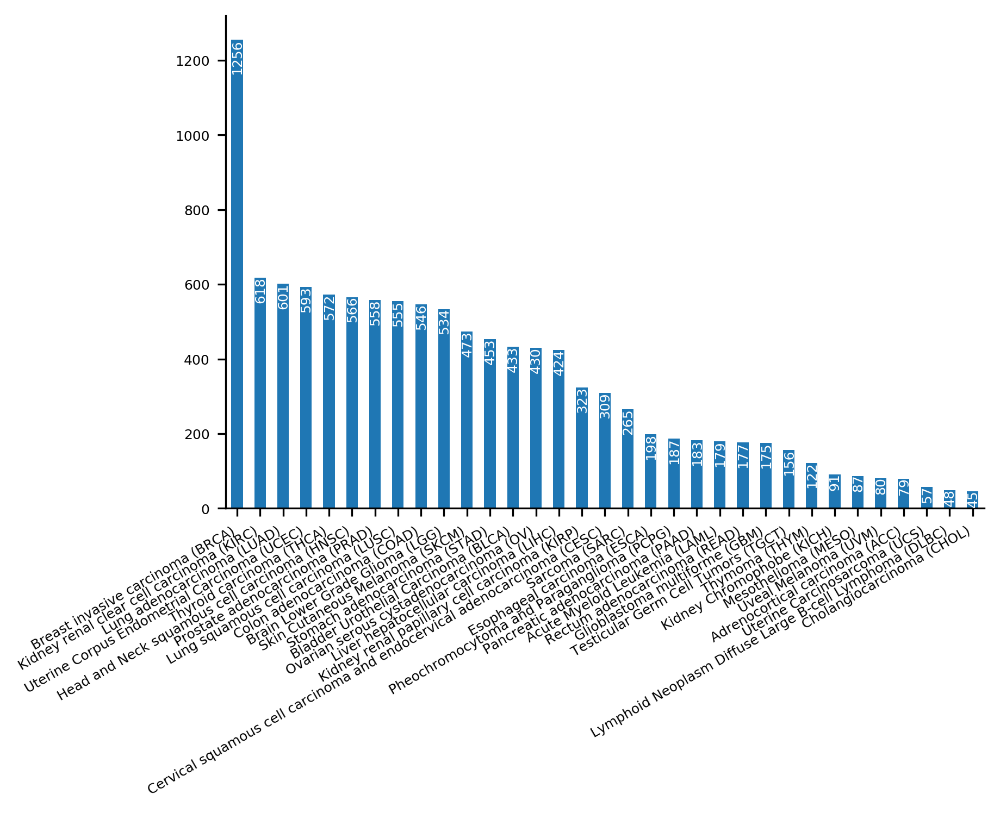

In [8]:
ax = data["CancerType"].apply(tcga_study_abbr_dict2.__getitem__).value_counts().plot(kind='bar')

for i in ax.patches:
    if i.get_height() >= 1:
        ax.text(i.get_x()+0.55, i.get_height() - 25 * len(str(int(round(i.get_height())))) + 15, 
                str(int(round(i.get_height()))), fontsize=6, rotation=90, color='w', ha='right')

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

ax.tick_params(axis="y", labelsize=6)

ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=6)

[Text(0, 0, 'Breast invasive carcinoma (BRCA)'),
 Text(0, 0, 'Kidney renal clear cell carcinoma (KIRC)'),
 Text(0, 0, 'Lung adenocarcinoma (LUAD)'),
 Text(0, 0, 'Uterine Corpus Endometrial Carcinoma (UCEC)'),
 Text(0, 0, 'Thyroid carcinoma (THCA)'),
 Text(0, 0, 'Head and Neck squamous cell carcinoma (HNSC)'),
 Text(0, 0, 'Prostate adenocarcinoma (PRAD)'),
 Text(0, 0, 'Lung squamous cell carcinoma (LUSC)'),
 Text(0, 0, 'Colon adenocarcinoma (COAD)'),
 Text(0, 0, 'Brain Lower Grade Glioma (LGG)'),
 Text(0, 0, 'Skin Cutaneous Melanoma (SKCM)'),
 Text(0, 0, 'Stomach adenocarcinoma (STAD)'),
 Text(0, 0, 'Bladder Urothelial Carcinoma (BLCA)'),
 Text(0, 0, 'Ovarian serous cystadenocarcinoma (OV)'),
 Text(0, 0, 'Liver hepatocellular carcinoma (LIHC)'),
 Text(0, 0, 'Kidney renal papillary cell carcinoma (KIRP)'),
 Text(0, 0, 'Cervical squamous cell carcinoma and endocervical adenocarcinoma (CESC)'),
 Text(0, 0, 'Sarcoma (SARC)'),
 Text(0, 0, 'Esophageal carcinoma (ESCA)'),
 Text(0, 0, 'Pheochro

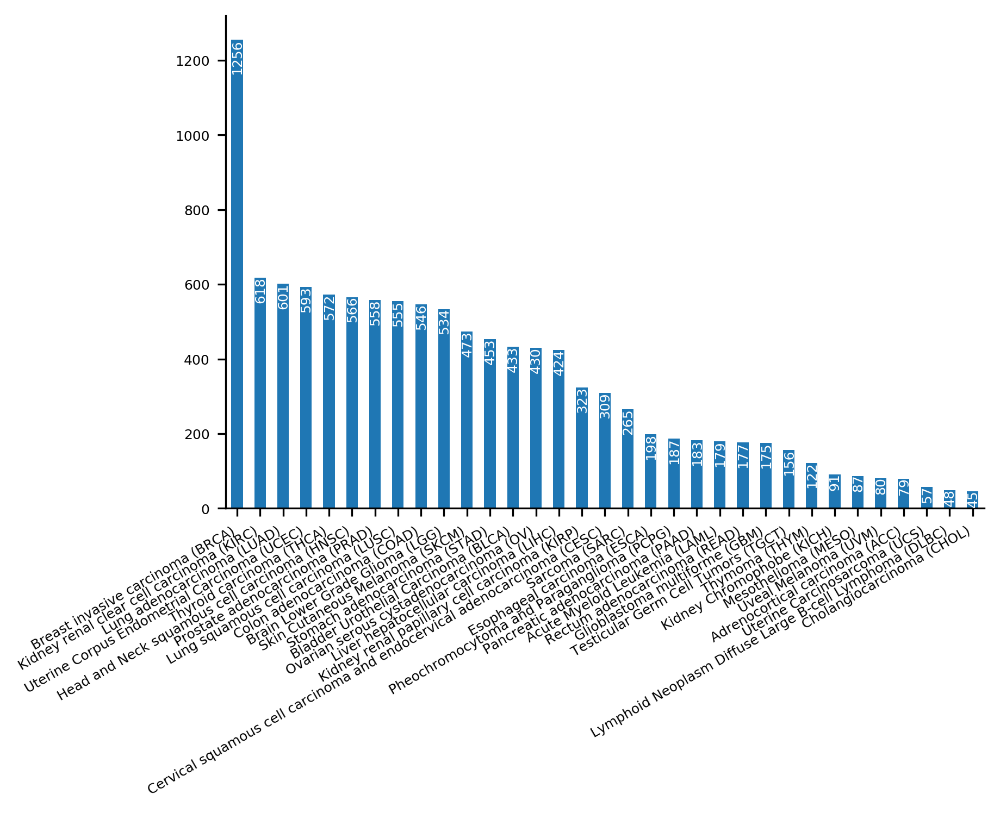

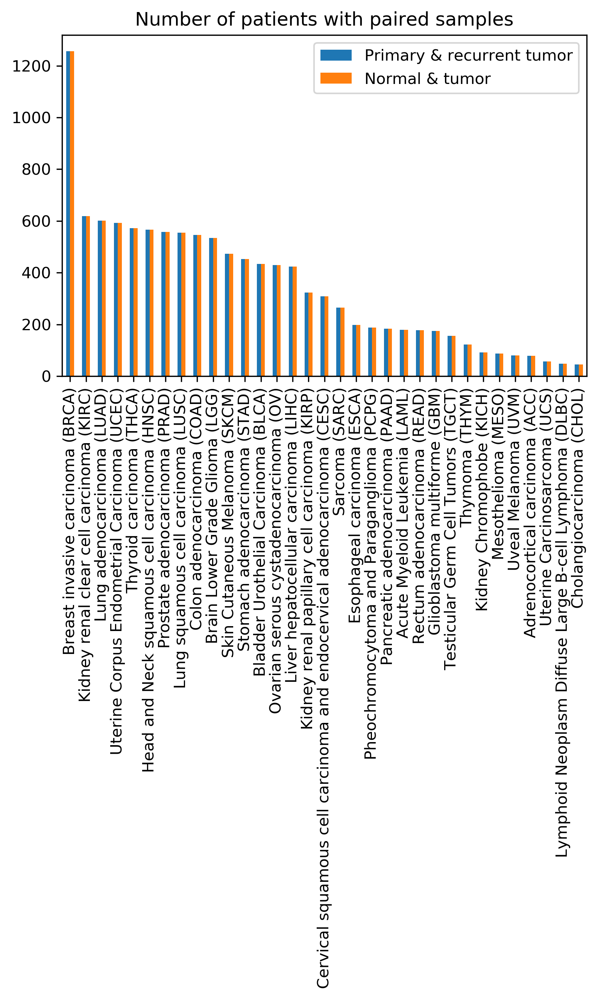

In [9]:
ax = data["CancerType"].apply(tcga_study_abbr_dict2.__getitem__).value_counts().plot(kind='bar')

pd.DataFrame({'Primary & recurrent tumor': data.CancerType.apply(tcga_study_abbr_dict2.__getitem__).value_counts(), 
              'Normal & tumor': data.CancerType.apply(tcga_study_abbr_dict2.__getitem__).value_counts()}).plot(kind = 'bar', title = 'Number of patients with paired samples')


for i in ax.patches:
    if i.get_height() >= 1:
        ax.text(i.get_x()+0.55, i.get_height() - 25 * len(str(int(round(i.get_height())))) + 15, 
                str(int(round(i.get_height()))), fontsize=6, rotation=90, color='w', ha='right')

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

ax.tick_params(axis="y", labelsize=6)

ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=6)

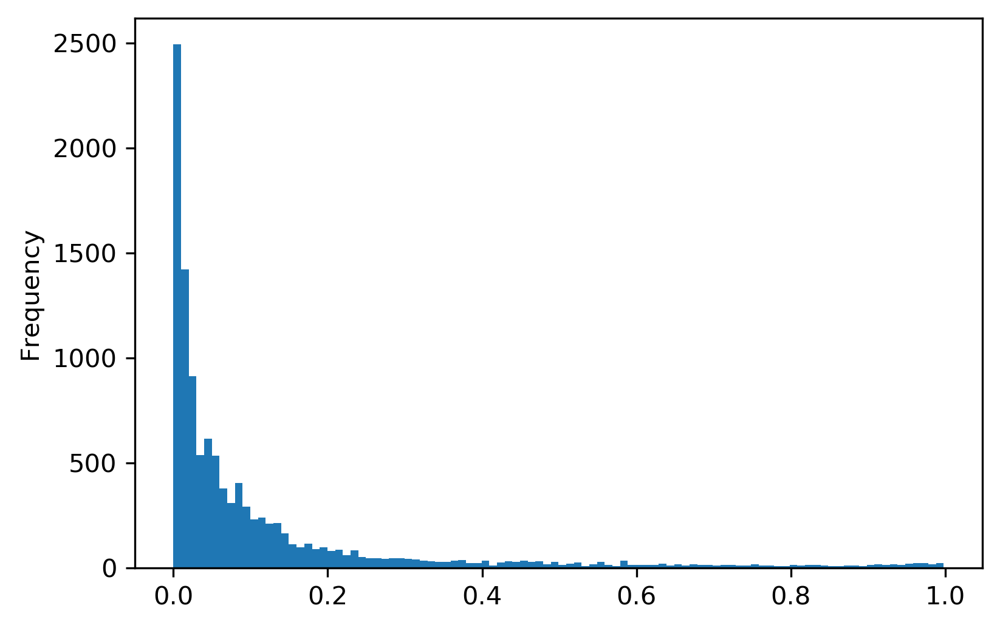

In [10]:
data['P.value'].plot(kind="hist", bins=100)

In [11]:
{'all': data['P.value'].apply(1.00.__ge__).sum(),
'0.05': data['P.value'].apply(0.05.__ge__).sum(),
'0.01': data['P.value'].apply(0.01.__ge__).sum()
}

{'all': 11373, '0.05': 6077, '0.01': 2893}

In [12]:
data['SampleID'].value_counts().where(lambda x: x > 1.0).dropna()

TCGA-AC-A2QH-01B-04R-A22O-07    3.0
TCGA-A7-A0DC-01B-04R-A22O-07    3.0
TCGA-A7-A26F-01B-04R-A22O-07    3.0
TCGA-A7-A0DC-01A-11R-A00Z-07    3.0
TCGA-A7-A26I-01B-06R-A22O-07    3.0
TCGA-A7-A13G-01B-04R-A22O-07    3.0
TCGA-AC-A3OD-01B-06R-A22O-07    3.0
TCGA-FI-A2F8-01A-12R-A17B-07    2.0
TCGA-AA-3495-01A-01R-1410-07    2.0
TCGA-37-4133-01A-01R-1100-07    2.0
TCGA-AZ-4315-01A-01R-1410-07    2.0
TCGA-A6-5665-01B-03R-2302-07    2.0
TCGA-CK-4951-01A-01R-1410-07    2.0
TCGA-A6-5661-01B-05R-2302-07    2.0
TCGA-37-4132-01A-01R-1100-07    2.0
TCGA-AA-3509-01A-01R-1410-07    2.0
TCGA-A7-A26I-01A-11R-A169-07    2.0
TCGA-AZ-4313-01A-01R-1410-07    2.0
TCGA-HC-8265-01B-04R-2302-07    2.0
TCGA-AZ-4614-01A-01R-1410-07    2.0
TCGA-HC-8258-01B-05R-2302-07    2.0
TCGA-AC-A3QQ-01B-06R-A22O-07    2.0
TCGA-A7-A26F-01A-21R-A169-07    2.0
TCGA-AJ-A23O-01A-11R-A157-07    2.0
TCGA-A7-A0DC-11A-41R-A089-07    2.0
TCGA-AA-A01Z-01A-11R-A083-07    2.0
TCGA-AZ-4684-01A-01R-1410-07    2.0
TCGA-AZ-4615-01A-01R-1410-07

In [13]:
data[data['SampleID'] == 'TCGA-A7-A0DC-01B-04R-A22O-07']

,SampleID,CancerType,B.cells.naive,B.cells.memory,Plasma.cells,T.cells.CD8,T.cells.CD4.naive,T.cells.CD4.memory.resting,T.cells.CD4.memory.activated,T.cells.follicular.helper,...,Macrophages.M2,Dendritic.cells.resting,Dendritic.cells.activated,Mast.cells.resting,Mast.cells.activated,Eosinophils,Neutrophils,P.value,Correlation,RMSE
1762,TCGA-A7-A0DC-01B-04R-A22O-07,BRCA,0.0,0.095566,0.045122,0.018111,0.130455,0.172505,0.0,0.0,...,0.115555,0.0,0.067555,0.251592,0.0,0.000000,0.0,0.108,0.099062,1.040622
1763,TCGA-A7-A0DC-01B-04R-A22O-07,BRCA,0.0,0.113939,0.040357,0.005743,0.067493,0.214965,0.0,0.0,...,0.125661,0.0,0.058962,0.278053,0.0,0.000000,0.0,0.138,0.078372,1.048953
1764,TCGA-A7-A0DC-01B-04R-A22O-07,BRCA,0.0,0.133703,0.046857,0.018552,0.031506,0.225782,0.0,0.0,...,0.104292,0.0,0.078465,0.211148,0.0,0.001334,0.0,0.244,0.045592,1.056600


In [14]:
tcga_sample_type_dict = {
    "01": "Primary Solid Tumor",
    "02": "Recurrent Solid Tumor",
    "03": "Primary Blood Derived Cancer - Peripheral Blood",
    "04": "Recurrent Blood Derived Cancer - Bone Marrow",
    "05": "Additional - New Primary",
    "06": "Metastatic",
    "07": "Additional Metastatic",
    "08": "Human Tumor Original Cells",
    "09": "Primary Blood Derived Cancer - Bone Marrow",
    "10": "Blood Derived Normal",
    "11": "Solid Tissue Normal",
    "12": "Buccal Cell Normal",
    "13": "EBV Immortalized Normal",
    "14": "Bone Marrow Normal",
    "15": "sample type 15",
    "16": "sample type 16",
    "20": "Control Analyte",
    "40": "Recurrent Blood Derived Cancer - Peripheral Blood",
    "50": "Cell Lines",
    "60": "Primary Xenograft Tissue",
    "61": "Cell Line Derived Xenograft Tissue",
    "99": "sample type 99"
}

# Basic statistics

In [15]:
f = lambda x: tcga_sample_type_dict[x.split('-')[3][0:2]]
all_data = data.copy()
all_data["SampleType"] = all_data["SampleID"].apply(f)
all_data.groupby(["CancerType", "SampleType"]).SampleID.count().to_frame()

SampleID
CancerType SampleType                     
ACC        Primary Solid Tumor          79
BLCA       Primary Solid Tumor         414
           Solid Tissue Normal          19
BRCA       Metastatic                    7
           Primary Solid Tumor        1135
...                                    ...
UCEC       Primary Solid Tumor         557
           Recurrent Solid Tumor         1
           Solid Tissue Normal          35
UCS        Primary Solid Tumor          57
UVM        Primary Solid Tumor          80

[82 rows x 1 columns]

In [16]:
all_data.SampleType.unique().tolist()

['Primary Solid Tumor',
 'Solid Tissue Normal',
 'Metastatic',
 'Recurrent Solid Tumor',
 'Additional - New Primary',
 'Primary Blood Derived Cancer - Peripheral Blood',
 'Additional Metastatic']

In [17]:
sample_size = pd.crosstab(all_data["CancerType"], all_data["SampleType"])
sample_size.T.style

CancerType,ACC,BLCA,BRCA,CESC,CHOL,COAD,DLBC,ESCA,GBM,HNSC,KICH,KIRC,KIRP,LAML,LGG,LIHC,LUAD,LUSC,MESO,OV,PAAD,PCPG,PRAD,READ,SARC,SKCM,STAD,TGCT,THCA,THYM,UCEC,UCS,UVM
SampleType,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Additional - New Primary,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,3,0,0,0,0,0,6,0,0,0,0,0
Additional Metastatic,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
Metastatic,0,0,7,2,0,1,0,1,0,2,0,0,0,0,0,0,0,0,0,0,1,2,1,0,1,368,0,0,8,0,0,0,0
Primary Blood Derived Cancer - Peripheral Blood,0,0,0,0,0,0,0,0,0,0,0,0,0,179,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Primary Solid Tumor,79,414,1135,304,36,503,48,184,157,520,66,545,290,0,516,371,540,504,87,423,178,179,505,166,259,103,416,150,505,120,557,57,80
Recurrent Solid Tumor,0,0,0,0,0,1,0,0,13,0,0,0,0,0,18,3,2,0,0,7,0,0,0,1,3,0,0,0,0,0,1,0,0
Solid Tissue Normal,0,19,114,3,9,41,0,13,5,44,25,72,32,0,0,50,59,51,0,0,4,3,52,10,2,1,37,0,59,2,35,0,0


(0.0, 1191.75)

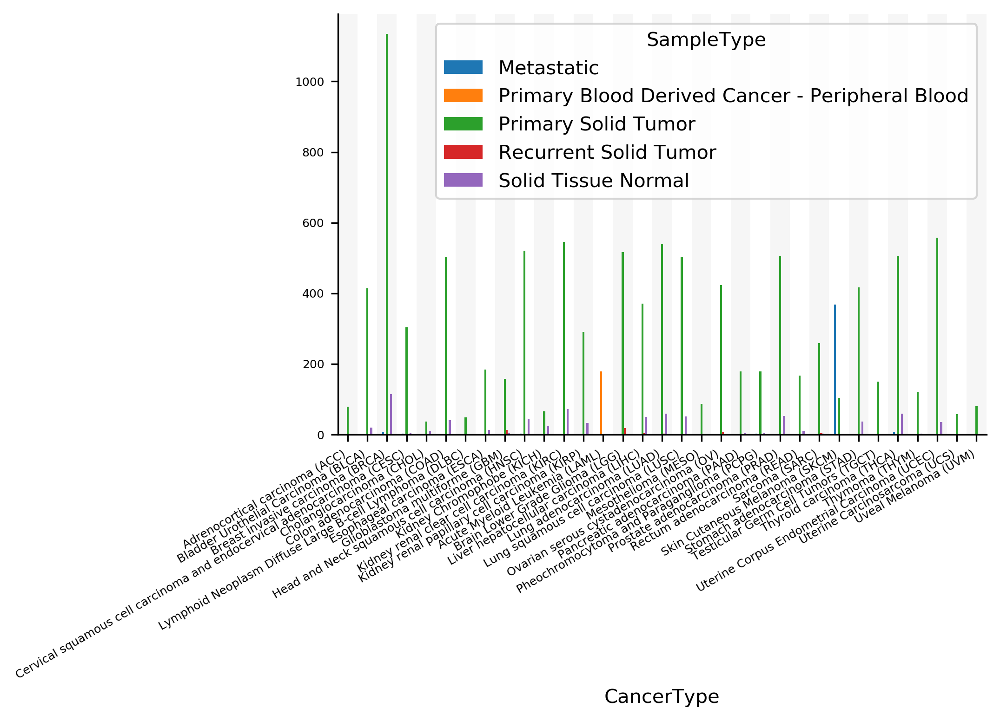

In [18]:
temp = sample_size.copy()
temp.drop('Additional - New Primary', axis = 1, inplace = True)
temp.drop('Additional Metastatic', axis = 1, inplace = True)
temp.index = temp.index.to_series().apply(tcga_study_abbr_dict2.__getitem__)
ax = temp.plot(kind='bar')

# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

ax.tick_params(axis="y", labelsize=6)

ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=6)

current_ylim = ax.get_ylim()

for i in range(len(sample_size)):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)
        
ax.set_ylim(current_ylim)

In [19]:
all_data

,SampleID,CancerType,B.cells.naive,B.cells.memory,Plasma.cells,T.cells.CD8,T.cells.CD4.naive,T.cells.CD4.memory.resting,T.cells.CD4.memory.activated,T.cells.follicular.helper,...,Dendritic.cells.resting,Dendritic.cells.activated,Mast.cells.resting,Mast.cells.activated,Eosinophils,Neutrophils,P.value,Correlation,RMSE,SampleType
0,TCGA-OR-A5JG-01A-11R-A29S-07,ACC,0.000000,0.048529,0.016052,0.046099,0.027037,0.290682,0.0,0.000000,...,0.002715,0.026125,0.032788,0.000000,0.010290,0.009607,0.112,0.095797,1.047142,Primary Solid Tumor
1,TCGA-OR-A5LG-01A-11R-A29S-07,ACC,0.007169,0.011125,0.007982,0.139842,0.000000,0.142742,0.0,0.001614,...,0.000000,0.007464,0.126237,0.000000,0.000000,0.000000,0.104,0.103345,1.046163,Primary Solid Tumor
2,TCGA-OR-A5JD-01A-11R-A29S-07,ACC,0.000023,0.014607,0.000000,0.104888,0.000000,0.174895,0.0,0.017928,...,0.000000,0.009330,0.000000,0.190730,0.000000,0.000000,0.068,0.143259,1.039812,Primary Solid Tumor
3,TCGA-OR-A5LH-01A-11R-A29S-07,ACC,0.047299,0.038180,0.000000,0.198591,0.000000,0.065240,0.0,0.043310,...,0.000000,0.000576,0.000000,0.064725,0.000000,0.000000,0.388,0.028763,1.080553,Primary Solid Tumor
4,TCGA-OR-A5KY-01A-11R-A29S-07,ACC,0.000000,0.024795,0.004418,0.051506,0.000000,0.225892,0.0,0.000000,...,0.000000,0.042827,0.000000,0.017418,0.014769,0.000000,0.246,0.055621,1.073474,Primary Solid Tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11368,TCGA-V4-A9EQ-01A-11R-A405-07,UVM,0.000000,0.028939,0.008894,0.000000,0.023294,0.015676,0.0,0.002279,...,0.009128,0.000000,0.208036,0.000000,0.000000,0.000000,0.090,0.111538,1.060529,Primary Solid Tumor
11369,TCGA-V4-A9EV-01A-11R-A405-07,UVM,0.000000,0.013299,0.025069,0.315356,0.000000,0.017361,0.0,0.095233,...,0.015558,0.000000,0.061707,0.000000,0.000000,0.000000,0.002,0.347125,0.952021,Primary Solid Tumor
11370,TCGA-V4-A9EY-01A-11R-A405-07,UVM,0.000000,0.032507,0.076160,0.061400,0.034359,0.000000,0.0,0.007778,...,0.004550,0.000000,0.227797,0.000000,0.000000,0.000000,0.086,0.113888,1.041876,Primary Solid Tumor
11371,TCGA-V4-A9EU-01A-11R-A405-07,UVM,0.000000,0.021228,0.010225,0.067985,0.003434,0.006675,0.0,0.004884,...,0.000000,0.000000,0.147489,0.000000,0.000000,0.000000,0.096,0.107852,1.068155,Primary Solid Tumor


In [20]:
cell_types = ['B.cells.naive', 'B.cells.memory', 'Plasma.cells', 'T.cells.CD8',
       'T.cells.CD4.naive', 'T.cells.CD4.memory.resting',
       'T.cells.CD4.memory.activated', 'T.cells.follicular.helper',
       'T.cells.regulatory..Tregs.', 'T.cells.gamma.delta', 'NK.cells.resting',
       'NK.cells.activated', 'Monocytes', 'Macrophages.M0', 'Macrophages.M1',
       'Macrophages.M2', 'Dendritic.cells.resting',
       'Dendritic.cells.activated', 'Mast.cells.resting',
       'Mast.cells.activated', 'Eosinophils', 'Neutrophils']

In [21]:
all_data['Leukocytes.all'] = all_data[cell_types].sum(1)

all_data['T.cells.all'] = all_data[['T.cells.CD8',
                                    'T.cells.CD4.naive',
                                    'T.cells.CD4.memory.resting',
                                    'T.cells.CD4.memory.activated',
                                    'T.cells.follicular.helper',
                                    'T.cells.regulatory..Tregs.',
                                    'T.cells.gamma.delta']].sum(1)

all_data['B.cells.all'] = all_data[['B.cells.naive', 'B.cells.memory', 'Plasma.cells']].sum(1)

all_data['Nk.cells.all'] = all_data[['NK.cells.resting', 'NK.cells.activated']].sum(1)

all_data['Macrophages.all'] = all_data[['Macrophages.M0', 'Macrophages.M1', 'Macrophages.M2']].sum(1)

all_data['Dendritic.cells.all'] = all_data[['Dendritic.cells.resting', 'Dendritic.cells.activated']].sum(1)

all_data['Mast.cells.all'] = all_data[['Mast.cells.resting', 'Mast.cells.activated']].sum(1)



augmented_cell_types = cell_types + ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 
                                     'Dendritic.cells.all', 'Mast.cells.all', 'Leukocytes.all']

## Commons

In [22]:
a = 0.05

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

for sample_type in sample_size.columns:
    sample_type_mean = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    sample_type_mean_lower = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    sample_type_mean_upper = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    sample_type_sd = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    sample_type_sd_lower = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    sample_type_sd_upper = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)

    for j in sample_type_mean.columns:
        n = ((all_data.CancerType == j) & (all_data.SampleType == sample_type)).sum()

        # Mean
        sample_type_mean.loc[:, j] = num_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].mean(axis=0)

        # Standard deviation
        sample_type_sd.loc[:, j] = all_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].std(ddof=1, axis=0)
        
        # Mean CI
        err = scipy.stats.t.ppf(1 - a / 2, n - 1) * sample_type_sd.loc[:, j] / np.sqrt(n)
        sample_type_mean_lower.loc[:, j] = sample_type_mean.loc[:, j] - err
        sample_type_mean_upper.loc[:, j] = sample_type_mean.loc[:, j] + err
        
        # Standard deviation CI
        sample_type_sd_lower.loc[:, j] = np.sqrt((n - 1) * sample_type_sd.loc[:, j] ** 2 / scipy.stats.chi2.ppf(1 - a / 2, n - 1))
        sample_type_sd_upper.loc[:, j] = np.sqrt((n - 1) * sample_type_sd.loc[:, j] ** 2 / scipy.stats.chi2.ppf(a / 2, n - 1))

    index_str_len = sample_type_mean.index.to_series().apply(lambda x: len(x)).max()
    index_str_len
        
    with pd.ExcelWriter(sample_type + " immune only.xlsx", engine="xlsxwriter") as writer:
        sample_type_mean.to_excel(writer, sheet_name="mean")
        sample_type_mean_lower.applymap(sanitize).to_excel(writer, sheet_name="mean 95% CI lower")
        sample_type_mean_upper.applymap(sanitize).to_excel(writer, sheet_name="mean 95% CI upper")
        
        sample_type_sd.to_excel(writer, sheet_name="sd")
        sample_type_sd_lower.to_excel(writer, sheet_name="sd 95% CI lower")
        sample_type_sd_upper.to_excel(writer, sheet_name="sd 95% CI upper")
        for i in writer.sheets:
            writer.sheets[i].set_column('A:A', index_str_len)

In [23]:
with pd.ExcelWriter("immune only.xlsx", engine="xlsxwriter") as writer:
    sample_size.T.to_excel(writer, sheet_name="summary")

In [24]:
offset_map = {
 'Metastatic': -0.2,
 'Recurrent Solid Tumor': -0.2,
 'Primary Blood Derived Cancer - Peripheral Blood': 0.0,
 'Primary Solid Tumor': 0.0,
 'Solid Tissue Normal': 0.2}

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

color_map = {#'Additional - New Primary' : colors[0],
 #'Additional Metastatic': colors[1],
 'Metastatic': colors[0],
 'Primary Blood Derived Cancer - Peripheral Blood': colors[1],
 'Primary Solid Tumor': colors[2],
 'Recurrent Solid Tumor': colors[3],
 'Solid Tissue Normal': colors[4]}

color_map

{'Metastatic': '#1f77b4',
 'Primary Blood Derived Cancer - Peripheral Blood': '#ff7f0e',
 'Primary Solid Tumor': '#2ca02c',
 'Recurrent Solid Tumor': '#d62728',
 'Solid Tissue Normal': '#9467bd'}

In [25]:
cancer_type_map = {v: i for i,v in enumerate(sample_size.index.tolist())}
cancer_type_map

{'ACC': 0,
 'BLCA': 1,
 'BRCA': 2,
 'CESC': 3,
 'CHOL': 4,
 'COAD': 5,
 'DLBC': 6,
 'ESCA': 7,
 'GBM': 8,
 'HNSC': 9,
 'KICH': 10,
 'KIRC': 11,
 'KIRP': 12,
 'LAML': 13,
 'LGG': 14,
 'LIHC': 15,
 'LUAD': 16,
 'LUSC': 17,
 'MESO': 18,
 'OV': 19,
 'PAAD': 20,
 'PCPG': 21,
 'PRAD': 22,
 'READ': 23,
 'SARC': 24,
 'SKCM': 25,
 'STAD': 26,
 'TGCT': 27,
 'THCA': 28,
 'THYM': 29,
 'UCEC': 30,
 'UCS': 31,
 'UVM': 32}

Text(0.5, 1.0, 'T.cells.CD8')

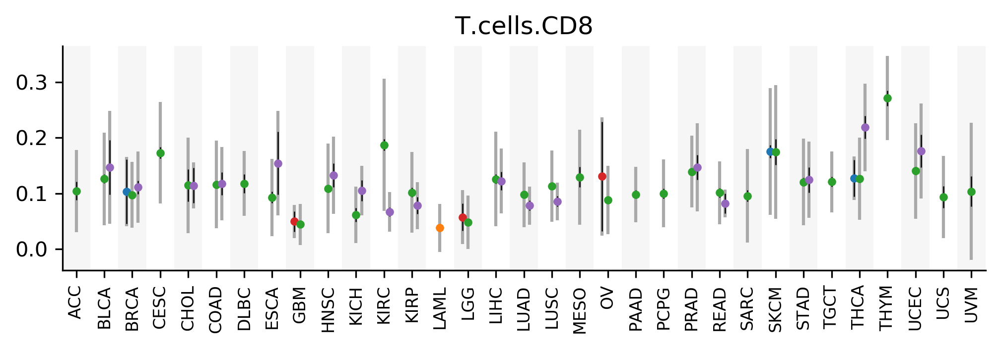

In [26]:
fig = plt.figure(figsize=(8,2))

ax = fig.add_subplot(111)

a = 0.05

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

cell_type = 'T.cells.CD8'

for sample_type in offset_map:
    sample_type_mean = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    sample_type_err = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    sample_type_sd = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)

    for j in sample_type_mean.columns:
        n = ((all_data.CancerType == j) & (all_data.SampleType == sample_type)).sum()
        
        if n > 5:
            # Mean
            sample_type_mean.loc[:, j] = num_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].mean(axis=0)

            # Standard deviation
            sample_type_sd.loc[:, j] = all_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].std(ddof=1, axis=0)

            # Mean CI
            sample_type_err.loc[:, j] = scipy.stats.t.ppf(1 - a / 2, n - 1) * sample_type_sd.loc[:, j] / np.sqrt(n)
        
    x = [cancer_type_map[cancer_type] + offset_map[sample_type] for cancer_type in cancer_type_map]
    y = [sample_type_mean.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]
    yerr = [[sample_type_err.loc[cell_type, cancer_type] for cancer_type in cancer_type_map], 
            [sample_type_sd.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]]
    
    ax.errorbar(x, y, yerr=yerr[1], fmt='.', color = color_map[sample_type], ecolor = 'darkgray', elinewidth=1.5)
    ax.errorbar(x, y, yerr=yerr[0], fmt="None", color = color_map[sample_type], ecolor = 'black', elinewidth=0.6)
    
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
#plt.vlines([i + 0.5 for i in list(cancer_type_map.values())[:-1]], ymin = ax.get_ylim()[0], ymax = ax.get_ylim()[1], 
#           color = 'lightgray', linestyles = 'dashed', linewidth=0.5)

for i in list(cancer_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], ax.get_ylim()[0], ax.get_ylim()[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(cancer_type_map) - 0.5)
# Ticks
plt.xticks(list(cancer_type_map.values()), list(cancer_type_map.keys()), rotation=90, fontsize=8)
plt.title(cell_type)

Text(0.5, 1.0, 'Plasma.cells')

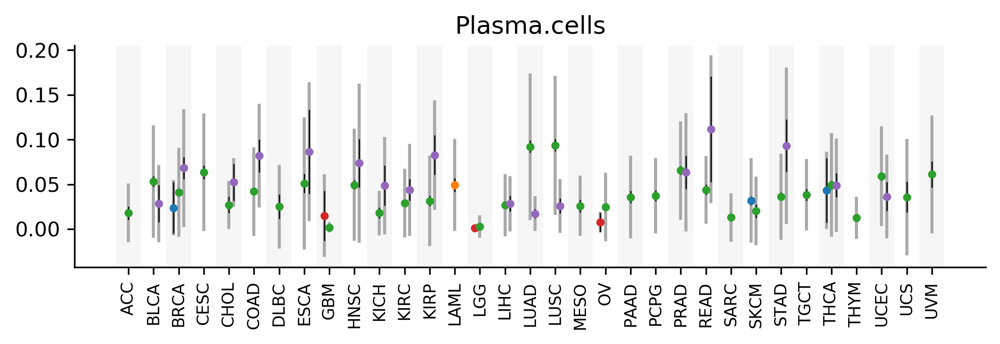

In [27]:
fig = plt.figure(figsize=(8,2))

ax = fig.add_subplot(111)

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

cell_type = 'Plasma.cells'

for sample_type in offset_map:
    sample_type_mean = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    sample_type_err = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    sample_type_sd = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)

    for j in sample_type_mean.columns:
        n = ((all_data.CancerType == j) & (all_data.SampleType == sample_type)).sum()
        
        if n > 5:
            # Mean
            sample_type_mean.loc[:, j] = num_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].mean(axis=0)

            # Standard deviation
            sample_type_sd.loc[:, j] = all_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].std(ddof=1, axis=0)

            # Mean CI
            sample_type_err.loc[:, j] = scipy.stats.t.ppf(1 - a / 2, n - 1) * sample_type_sd.loc[:, j] / np.sqrt(n)
        
    x = [cancer_type_map[cancer_type] + offset_map[sample_type] for cancer_type in cancer_type_map]
    y = [sample_type_mean.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]
    yerr = [[sample_type_err.loc[cell_type, cancer_type] for cancer_type in cancer_type_map], 
            [sample_type_sd.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]]
    
    ax.errorbar(x, y, yerr=yerr[1], fmt='.', color = color_map[sample_type], ecolor = 'darkgray', elinewidth=1.5)
    ax.errorbar(x, y, yerr=yerr[0], fmt="None", color = color_map[sample_type], ecolor = 'black', elinewidth=0.6)
    
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
#plt.vlines([i + 0.5 for i in list(cancer_type_map.values())[:-1]], ymin = ax.get_ylim()[0], ymax = ax.get_ylim()[1], 
#           color = 'lightgray', linestyles = 'dashed', linewidth=0.5)

for i in list(cancer_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)

# Ticks
plt.xticks(list(cancer_type_map.values()), list(cancer_type_map.keys()), rotation=90, fontsize=8)
plt.title(cell_type)

In [28]:
augmented_cell_types

['B.cells.naive',
 'B.cells.memory',
 'Plasma.cells',
 'T.cells.CD8',
 'T.cells.CD4.naive',
 'T.cells.CD4.memory.resting',
 'T.cells.CD4.memory.activated',
 'T.cells.follicular.helper',
 'T.cells.regulatory..Tregs.',
 'T.cells.gamma.delta',
 'NK.cells.resting',
 'NK.cells.activated',
 'Monocytes',
 'Macrophages.M0',
 'Macrophages.M1',
 'Macrophages.M2',
 'Dendritic.cells.resting',
 'Dendritic.cells.activated',
 'Mast.cells.resting',
 'Mast.cells.activated',
 'Eosinophils',
 'Neutrophils',
 'T.cells.all',
 'B.cells.all',
 'Nk.cells.all',
 'Macrophages.all',
 'Dendritic.cells.all',
 'Mast.cells.all',
 'Leukocytes.all']

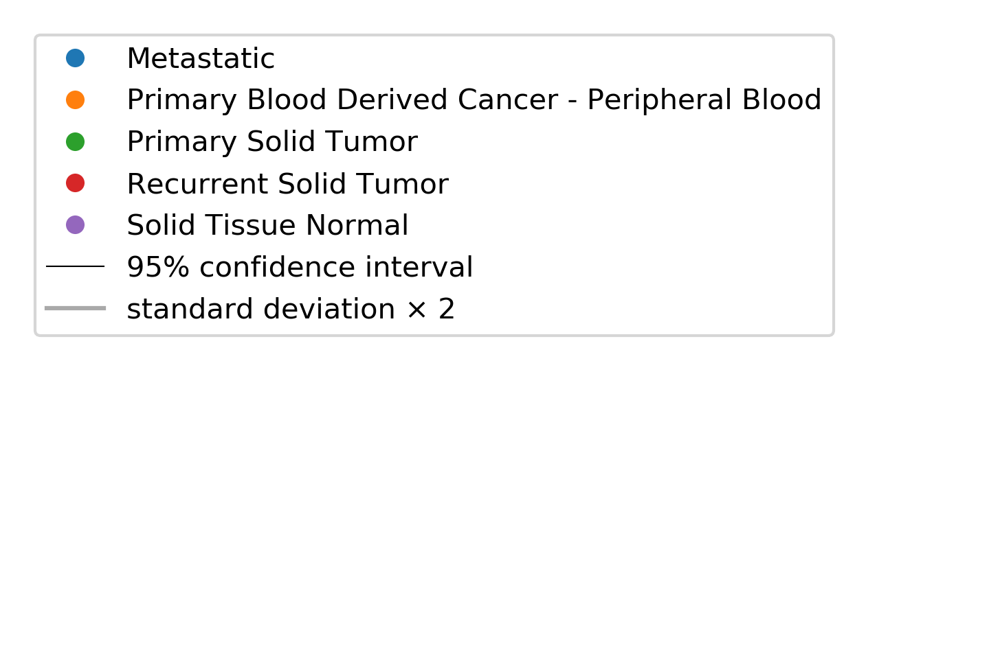

In [29]:
legend_elements = [mpl.lines.Line2D([0], [0], marker='.', color='w', markerfacecolor=color_map[i], label=i, markersize=15) 
                   for i in color_map]

legend_elements.append(mpl.lines.Line2D([0], [0], marker='None', color='black', label='95% confidence interval', linewidth=0.5))
legend_elements.append(mpl.lines.Line2D([0], [0], marker='None', color='darkgray', label='standard deviation × 2', linewidth=1.5))

# Create the figure
fig, ax = plt.subplots()
ax.legend(handles=legend_elements, loc='upper left')

ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

[Text(0, 0, 'ACC'),
 Text(0, 0, 'BLCA'),
 Text(0, 0, 'BRCA'),
 Text(0, 0, 'CESC'),
 Text(0, 0, 'CHOL'),
 Text(0, 0, 'COAD'),
 Text(0, 0, 'DLBC'),
 Text(0, 0, 'ESCA'),
 Text(0, 0, 'GBM'),
 Text(0, 0, 'HNSC'),
 Text(0, 0, 'KICH'),
 Text(0, 0, 'KIRC'),
 Text(0, 0, 'KIRP'),
 Text(0, 0, 'LAML'),
 Text(0, 0, 'LGG'),
 Text(0, 0, 'LIHC'),
 Text(0, 0, 'LUAD'),
 Text(0, 0, 'LUSC'),
 Text(0, 0, 'MESO'),
 Text(0, 0, 'OV'),
 Text(0, 0, 'PAAD'),
 Text(0, 0, 'PCPG'),
 Text(0, 0, 'PRAD'),
 Text(0, 0, 'READ'),
 Text(0, 0, 'SARC'),
 Text(0, 0, 'SKCM'),
 Text(0, 0, 'STAD'),
 Text(0, 0, 'TGCT'),
 Text(0, 0, 'THCA'),
 Text(0, 0, 'THYM'),
 Text(0, 0, 'UCEC'),
 Text(0, 0, 'UCS'),
 Text(0, 0, 'UVM')]

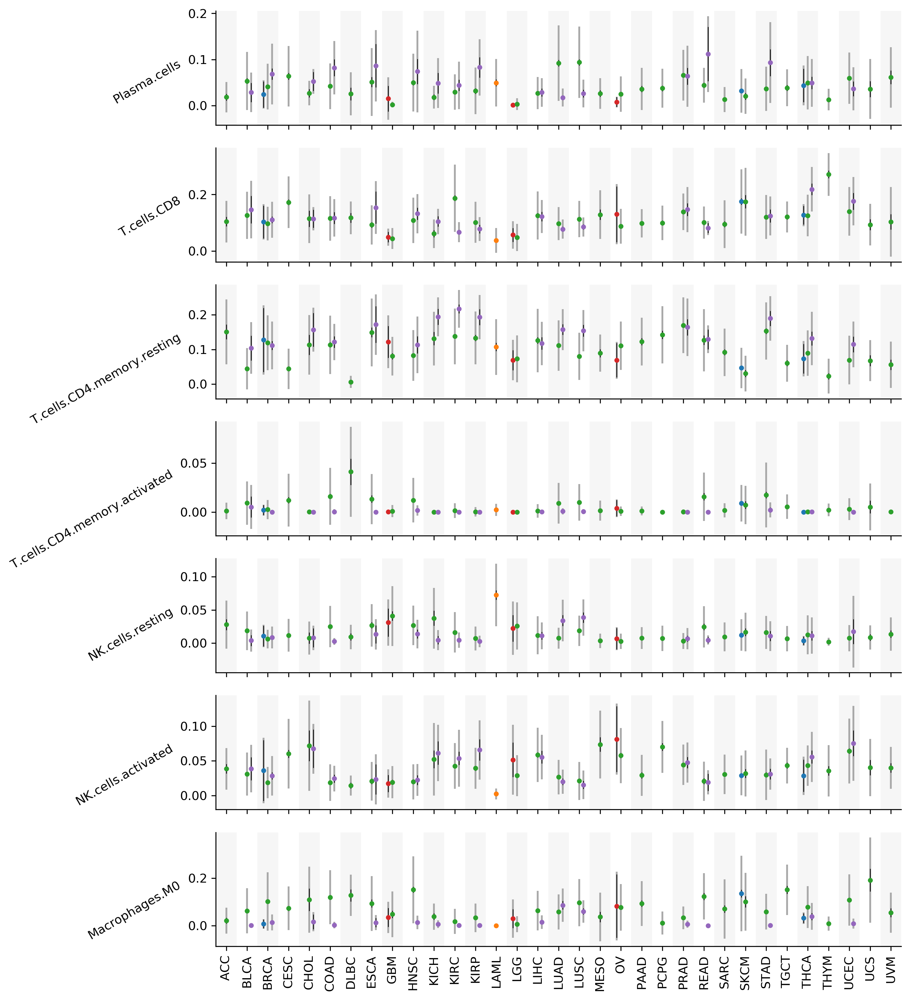

In [30]:
plot_cell_types = [
 'Plasma.cells',
 'T.cells.CD8',
 'T.cells.CD4.memory.resting',
 'T.cells.CD4.memory.activated',
 'NK.cells.resting',
 'NK.cells.activated',
 'Macrophages.M0']

fig = plt.figure(figsize=(10, 2 * len(plot_cell_types)))

plot_cell_types_map = {v: i for i, v in enumerate(plot_cell_types)}

axes = []

a = 0.05

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

for cell_type in plot_cell_types:
    if len(axes) == 0:
        ax = fig.add_subplot(len(plot_cell_types), 1, 1)
    else:
        ax = fig.add_subplot(len(plot_cell_types), 1, len(axes) + 1, sharex = axes[0])
    
    axes.append(ax)
    
    for sample_type in offset_map:
        sample_type_mean = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
        sample_type_err = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
        sample_type_sd = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)

        for j in sample_type_mean.columns:
            n = ((all_data.CancerType == j) & (all_data.SampleType == sample_type)).sum()

            if n > 5:
                # Mean
                sample_type_mean.loc[:, j] = num_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].mean(axis=0)

                # Standard deviation
                sample_type_sd.loc[:, j] = num_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].std(ddof=1, axis=0)

                # Mean CI
                sample_type_err.loc[:, j] = scipy.stats.t.ppf(1 - a / 2, n - 1) * sample_type_sd.loc[:, j] / np.sqrt(n)

        x = [cancer_type_map[cancer_type] + offset_map[sample_type] for cancer_type in cancer_type_map]
        y = [sample_type_mean.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]
        yerr = [[sample_type_err.loc[cell_type, cancer_type] for cancer_type in cancer_type_map], 
                [sample_type_sd.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]]

        ax.errorbar(x, y, yerr=yerr[1], fmt='.', color = color_map[sample_type], ecolor = 'darkgray', elinewidth=1.5)
        ax.errorbar(x, y, yerr=yerr[0], fmt="None", color = color_map[sample_type], ecolor = 'black', elinewidth=0.6)

    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')


    current_ylim = ax.get_ylim()
    for i in list(cancer_type_map.values()):
        if i % 2 == 0:
            ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

    ax.set_ylim(current_ylim)
    ax.set_xticks(list(cancer_type_map.values()))
    ax.tick_params(axis='x', which = 'both', labelbottom=None)
    ax.set_ylabel(cell_type, rotation = 30, ha = 'right')
    ax.set_xlim(-0.5, len(cancer_type_map) - 0.5)
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(cancer_type_map.values()))
ax.set_xticklabels(list(cancer_type_map.keys()), rotation=90)

[Text(0, 0, 'ACC'),
 Text(0, 0, 'BLCA'),
 Text(0, 0, 'BRCA'),
 Text(0, 0, 'CESC'),
 Text(0, 0, 'CHOL'),
 Text(0, 0, 'COAD'),
 Text(0, 0, 'DLBC'),
 Text(0, 0, 'ESCA'),
 Text(0, 0, 'GBM'),
 Text(0, 0, 'HNSC'),
 Text(0, 0, 'KICH'),
 Text(0, 0, 'KIRC'),
 Text(0, 0, 'KIRP'),
 Text(0, 0, 'LAML'),
 Text(0, 0, 'LGG'),
 Text(0, 0, 'LIHC'),
 Text(0, 0, 'LUAD'),
 Text(0, 0, 'LUSC'),
 Text(0, 0, 'MESO'),
 Text(0, 0, 'OV'),
 Text(0, 0, 'PAAD'),
 Text(0, 0, 'PCPG'),
 Text(0, 0, 'PRAD'),
 Text(0, 0, 'READ'),
 Text(0, 0, 'SARC'),
 Text(0, 0, 'SKCM'),
 Text(0, 0, 'STAD'),
 Text(0, 0, 'TGCT'),
 Text(0, 0, 'THCA'),
 Text(0, 0, 'THYM'),
 Text(0, 0, 'UCEC'),
 Text(0, 0, 'UCS'),
 Text(0, 0, 'UVM')]

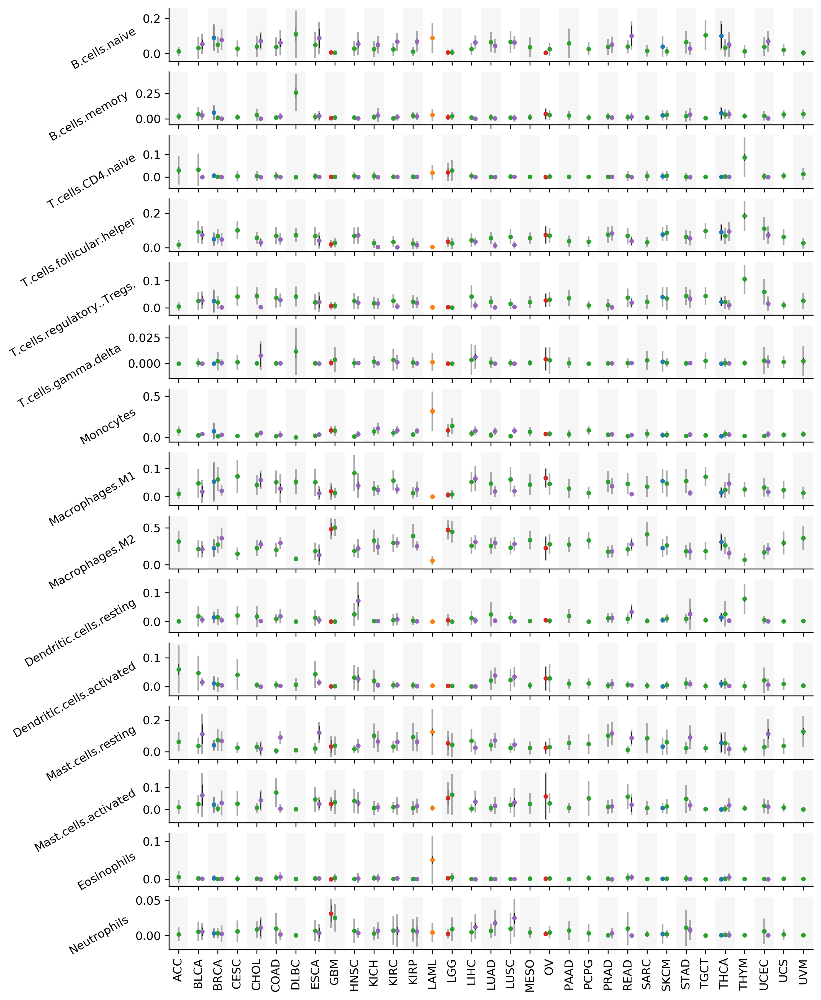

In [31]:
plot_cell_types = ['B.cells.naive',
 'B.cells.memory',
 'T.cells.CD4.naive',
 'T.cells.follicular.helper',
 'T.cells.regulatory..Tregs.',
 'T.cells.gamma.delta',
 'Monocytes',
 'Macrophages.M1',
 'Macrophages.M2',
 'Dendritic.cells.resting',
 'Dendritic.cells.activated',
 'Mast.cells.resting',
 'Mast.cells.activated',
 'Eosinophils',
 'Neutrophils']

fig = plt.figure(figsize=(10, 1 * len(plot_cell_types)))

plot_cell_types_map = {v: i for i, v in enumerate(plot_cell_types)}

axes = []

a = 0.05

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

for cell_type in plot_cell_types:
    if len(axes) == 0:
        ax = fig.add_subplot(len(plot_cell_types), 1, 1)
    else:
        ax = fig.add_subplot(len(plot_cell_types), 1, len(axes) + 1, sharex = axes[0])
    
    axes.append(ax)
    
    for sample_type in offset_map:
        sample_type_mean = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
        sample_type_err = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
        sample_type_sd = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)

        for j in sample_type_mean.columns:
            n = ((all_data.CancerType == j) & (all_data.SampleType == sample_type)).sum()

            if n > 5:
                # Mean
                sample_type_mean.loc[:, j] = num_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].mean(axis=0)

                # Standard deviation
                sample_type_sd.loc[:, j] = num_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].std(ddof=1, axis=0)

                # Mean CI
                sample_type_err.loc[:, j] = scipy.stats.t.ppf(1 - a / 2, n - 1) * sample_type_sd.loc[:, j] / np.sqrt(n)

        x = [cancer_type_map[cancer_type] + offset_map[sample_type] for cancer_type in cancer_type_map]
        y = [sample_type_mean.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]
        yerr = [[sample_type_err.loc[cell_type, cancer_type] for cancer_type in cancer_type_map], 
                [sample_type_sd.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]]

        ax.errorbar(x, y, yerr=yerr[1], fmt='.', color = color_map[sample_type], ecolor = 'darkgray', elinewidth=1.5)
        ax.errorbar(x, y, yerr=yerr[0], fmt="None", color = color_map[sample_type], ecolor = 'black', elinewidth=0.6)

    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')


    current_ylim = ax.get_ylim()
    for i in list(cancer_type_map.values()):
        if i % 2 == 0:
            ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

    ax.set_ylim(current_ylim)
    ax.set_xticks(list(cancer_type_map.values()))
    ax.tick_params(axis='x', which = 'both', labelbottom=None)
    ax.set_ylabel(cell_type, rotation = 30, ha = 'right')
    ax.set_xlim(-0.5, len(cancer_type_map) - 0.5)
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(cancer_type_map.values()))
ax.set_xticklabels(list(cancer_type_map.keys()), rotation=90)

[Text(0, 0, 'ACC'),
 Text(0, 0, 'BLCA'),
 Text(0, 0, 'BRCA'),
 Text(0, 0, 'CESC'),
 Text(0, 0, 'CHOL'),
 Text(0, 0, 'COAD'),
 Text(0, 0, 'DLBC'),
 Text(0, 0, 'ESCA'),
 Text(0, 0, 'GBM'),
 Text(0, 0, 'HNSC'),
 Text(0, 0, 'KICH'),
 Text(0, 0, 'KIRC'),
 Text(0, 0, 'KIRP'),
 Text(0, 0, 'LAML'),
 Text(0, 0, 'LGG'),
 Text(0, 0, 'LIHC'),
 Text(0, 0, 'LUAD'),
 Text(0, 0, 'LUSC'),
 Text(0, 0, 'MESO'),
 Text(0, 0, 'OV'),
 Text(0, 0, 'PAAD'),
 Text(0, 0, 'PCPG'),
 Text(0, 0, 'PRAD'),
 Text(0, 0, 'READ'),
 Text(0, 0, 'SARC'),
 Text(0, 0, 'SKCM'),
 Text(0, 0, 'STAD'),
 Text(0, 0, 'TGCT'),
 Text(0, 0, 'THCA'),
 Text(0, 0, 'THYM'),
 Text(0, 0, 'UCEC'),
 Text(0, 0, 'UCS'),
 Text(0, 0, 'UVM')]

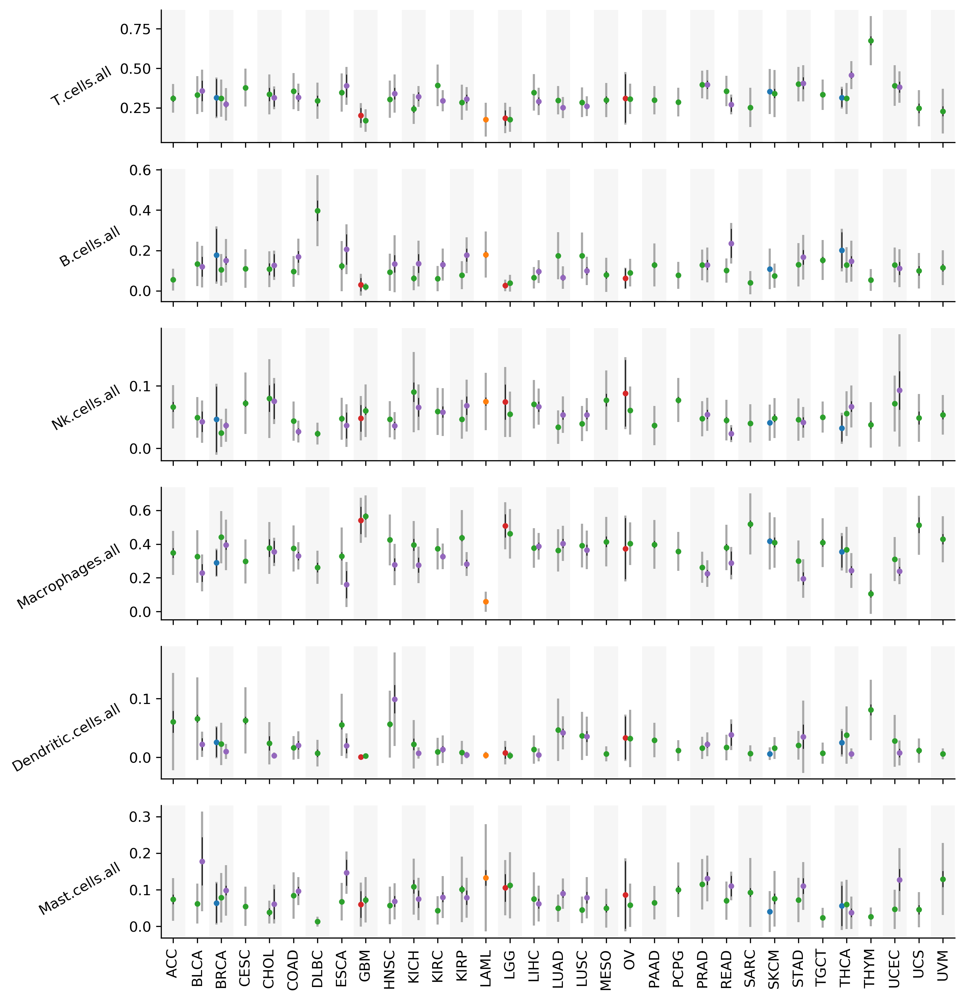

In [32]:
plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 
                                     'Dendritic.cells.all', 'Mast.cells.all']

fig = plt.figure(figsize=(10, 2 * len(plot_cell_types)))

plot_cell_types_map = {v: i for i, v in enumerate(plot_cell_types)}

axes = []

a = 0.05

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

for cell_type in plot_cell_types:
    if len(axes) == 0:
        ax = fig.add_subplot(len(plot_cell_types), 1, 1)
    else:
        ax = fig.add_subplot(len(plot_cell_types), 1, len(axes) + 1, sharex = axes[0])
    
    axes.append(ax)
    
    for sample_type in offset_map:
        sample_type_mean = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
        sample_type_err = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
        sample_type_sd = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)

        for j in sample_type_mean.columns:
            n = ((all_data.CancerType == j) & (all_data.SampleType == sample_type)).sum()

            if n > 5:
                # Mean
                sample_type_mean.loc[:, j] = num_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].mean(axis=0)

                # Standard deviation
                sample_type_sd.loc[:, j] = num_data[(all_data.CancerType == j) & (all_data.SampleType == sample_type)].std(ddof=1, axis=0)

                # Mean CI
                sample_type_err.loc[:, j] = scipy.stats.t.ppf(1 - a / 2, n - 1) * sample_type_sd.loc[:, j] / np.sqrt(n)

        x = [cancer_type_map[cancer_type] + offset_map[sample_type] for cancer_type in cancer_type_map]
        y = [sample_type_mean.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]
        yerr = [[sample_type_err.loc[cell_type, cancer_type] for cancer_type in cancer_type_map], 
                [sample_type_sd.loc[cell_type, cancer_type] for cancer_type in cancer_type_map]]

        ax.errorbar(x, y, yerr=yerr[1], fmt='.', color = color_map[sample_type], ecolor = 'darkgray', elinewidth=1.5)
        ax.errorbar(x, y, yerr=yerr[0], fmt="None", color = color_map[sample_type], ecolor = 'black', elinewidth=0.6)

    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')


    current_ylim = ax.get_ylim()
    for i in list(cancer_type_map.values()):
        if i % 2 == 0:
            ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

    ax.set_ylim(current_ylim)
    ax.set_xlim(-0.5, len(cancer_type_map) - 0.5)
    ax.set_xticks(list(cancer_type_map.values()))
    ax.tick_params(axis='x', which = 'both', labelbottom=None)
    ax.set_ylabel(cell_type, rotation = 30, ha = 'right')

# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(cancer_type_map.values()))
ax.set_xticklabels(list(cancer_type_map.keys()), rotation=90)

In [33]:
ax.get_ylim()

(-0.03218559637281047, 0.3305734008396919)

In [34]:
list(cancer_type_map.values())

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32]

In [35]:
all_data.SampleType

0        Primary Solid Tumor
1        Primary Solid Tumor
2        Primary Solid Tumor
3        Primary Solid Tumor
4        Primary Solid Tumor
                ...         
11368    Primary Solid Tumor
11369    Primary Solid Tumor
11370    Primary Solid Tumor
11371    Primary Solid Tumor
11372    Primary Solid Tumor
Name: SampleType, Length: 11373, dtype: object

In [36]:
def diff_ci(n, m, s, alpha = .05):
    nu = (s[0] ** 2 / n[0] + s[1] ** 2 / n[1]) ** 2 / \
         ((s[0] ** 2 / n[0]) ** 2 / (n[0] - 1) + (s[1] ** 2 / n[1]) ** 2 / (n[1] - 1))
    sp = (s[0] ** 2 / n[0] + s[1] ** 2 / n[1]) ** .5
    diff = m[1] - m[0]
    err = scipy.stats.t.ppf(1 - a / 2, nu) * sp
    return [diff - err, diff + err]

[Text(0, 0, 'ACC'),
 Text(0, 0, 'BLCA'),
 Text(0, 0, 'BRCA'),
 Text(0, 0, 'CESC'),
 Text(0, 0, 'CHOL'),
 Text(0, 0, 'COAD'),
 Text(0, 0, 'DLBC'),
 Text(0, 0, 'ESCA'),
 Text(0, 0, 'GBM'),
 Text(0, 0, 'HNSC'),
 Text(0, 0, 'KICH'),
 Text(0, 0, 'KIRC'),
 Text(0, 0, 'KIRP'),
 Text(0, 0, 'LAML'),
 Text(0, 0, 'LGG'),
 Text(0, 0, 'LIHC'),
 Text(0, 0, 'LUAD'),
 Text(0, 0, 'LUSC'),
 Text(0, 0, 'MESO'),
 Text(0, 0, 'OV'),
 Text(0, 0, 'PAAD'),
 Text(0, 0, 'PCPG'),
 Text(0, 0, 'PRAD'),
 Text(0, 0, 'READ'),
 Text(0, 0, 'SARC'),
 Text(0, 0, 'SKCM'),
 Text(0, 0, 'STAD'),
 Text(0, 0, 'TGCT'),
 Text(0, 0, 'THCA'),
 Text(0, 0, 'THYM'),
 Text(0, 0, 'UCEC'),
 Text(0, 0, 'UCS'),
 Text(0, 0, 'UVM')]

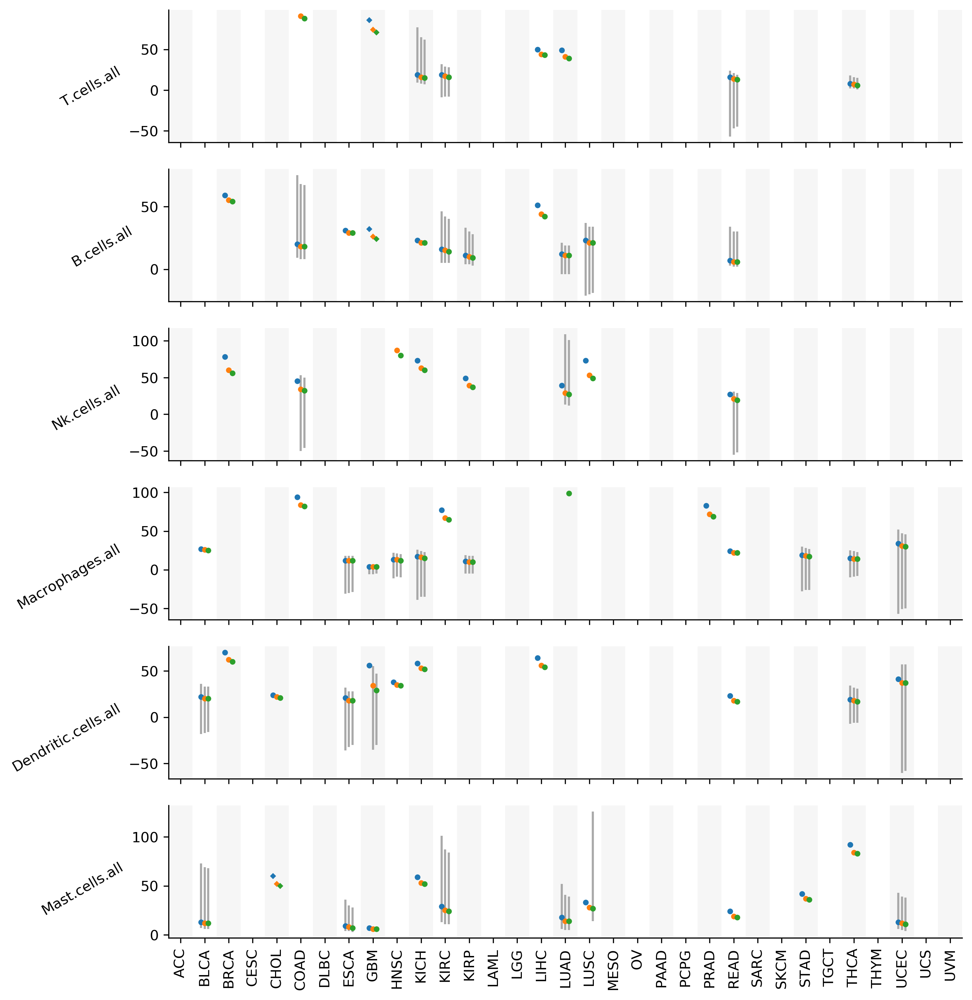

In [37]:
x_map = cancer_type_map

offset_map = { 
 100: -0.15,
 384: -0.0,
 1000: 0.15
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2]}

plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 
                                     'Dendritic.cells.all', 'Mast.cells.all']

fig = plt.figure(figsize=(10, 2 * len(plot_cell_types)))

plot_cell_types_map = {v: i for i, v in enumerate(plot_cell_types)}

axes = []

a = 0.05

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

for cell_type in plot_cell_types:
    if len(axes) == 0:
        ax = fig.add_subplot(len(plot_cell_types), 1, 1)
    else:
        ax = fig.add_subplot(len(plot_cell_types), 1, len(axes) + 1, sharex = axes[0])
    
    axes.append(ax)
    
    normal_mean = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    # sample_type_err = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    normal_sd = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    
    primary_mean = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    # sample_type_err = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)
    primary_sd = pd.DataFrame(index = augmented_cell_types, columns = sample_size.index)

    
    for cancer_type in sample_type_mean.columns:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 5 or primary_n < 5: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        for cell_number in offset_map:
            x = x_map[cancer_type] + offset_map[cell_number]
            y = sensei.optimize.find_minimum_M(100, cell_number, 
                                               [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                               beta=0.2, design='unpaired')
            if (primary_mean - normal_mean > 0 and lower_diff > 0 and upper_diff > 0) or \
               (primary_mean - normal_mean < 0 and lower_diff < 0 and upper_diff < 0):
                y_lower = sensei.optimize.find_minimum_M_override(100, cell_number, 
                                                                  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                                                  beta=0.2, design='unpaired', override_diff = lower_diff)
                y_upper = sensei.optimize.find_minimum_M_override(100, cell_number, 
                                                                  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                                                  beta=0.2, design='unpaired', override_diff = upper_diff)
                ax.errorbar(x, y, yerr=[[y_lower], [y_upper]], fmt='.', color = color_map[cell_number], 
                            ecolor = 'darkgray', elinewidth=1.5)
            else:
                ax.errorbar(x, y, yerr=0, fmt='D', color = color_map[cell_number], ecolor = 'darkgray', 
                            elinewidth=1.5, markersize=2)
            
                
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')


    current_ylim = ax.get_ylim()
    for i in list(cancer_type_map.values()):
        if i % 2 == 0:
            ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

    ax.set_ylim(current_ylim)
    ax.set_xlim(-0.5, len(cancer_type_map) - 0.5)
    ax.set_xticks(list(cancer_type_map.values()))
    ax.tick_params(axis='x', which = 'both', labelbottom=None)
    ax.set_ylabel(cell_type, rotation = 30, ha = 'right')

# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(cancer_type_map.values()))
ax.set_xticklabels(list(cancer_type_map.keys()), rotation=90)

In [38]:
cancer_types = list(cancer_type_map.keys())
cancer_types

['ACC',
 'BLCA',
 'BRCA',
 'CESC',
 'CHOL',
 'COAD',
 'DLBC',
 'ESCA',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LAML',
 'LGG',
 'LIHC',
 'LUAD',
 'LUSC',
 'MESO',
 'OV',
 'PAAD',
 'PCPG',
 'PRAD',
 'READ',
 'SARC',
 'SKCM',
 'STAD',
 'TGCT',
 'THCA',
 'THYM',
 'UCEC',
 'UCS',
 'UVM']

[Text(0, 0, 'ACC'),
 Text(0, 0, 'BLCA'),
 Text(0, 0, 'BRCA'),
 Text(0, 0, 'CESC'),
 Text(0, 0, 'CHOL'),
 Text(0, 0, 'COAD'),
 Text(0, 0, 'DLBC'),
 Text(0, 0, 'ESCA'),
 Text(0, 0, 'GBM'),
 Text(0, 0, 'HNSC'),
 Text(0, 0, 'KICH'),
 Text(0, 0, 'KIRC'),
 Text(0, 0, 'KIRP'),
 Text(0, 0, 'LAML'),
 Text(0, 0, 'LGG'),
 Text(0, 0, 'LIHC'),
 Text(0, 0, 'LUAD'),
 Text(0, 0, 'LUSC'),
 Text(0, 0, 'MESO'),
 Text(0, 0, 'OV'),
 Text(0, 0, 'PAAD'),
 Text(0, 0, 'PCPG'),
 Text(0, 0, 'PRAD'),
 Text(0, 0, 'READ'),
 Text(0, 0, 'SARC'),
 Text(0, 0, 'SKCM'),
 Text(0, 0, 'STAD'),
 Text(0, 0, 'TGCT'),
 Text(0, 0, 'THCA'),
 Text(0, 0, 'THYM'),
 Text(0, 0, 'UCEC'),
 Text(0, 0, 'UCS'),
 Text(0, 0, 'UVM')]

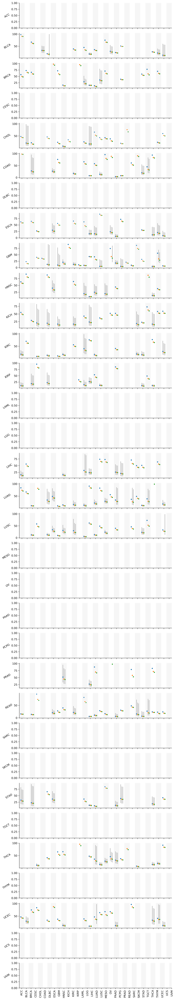

In [39]:
offset_map = { 
 100: -0.2,
 384: -0.0,
 1000: 0.2
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2]}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types

plot_cancer_types = ['ACC',
 'BLCA',
 'BRCA',
 'CESC',
 'CHOL',
 'COAD',
 'DLBC',
 'ESCA',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LAML',
 'LGG',
 'LIHC',
 'LUAD',
 'LUSC',
 'MESO',
 'OV',
 'PAAD',
 'PCPG',
 'PRAD',
 'READ',
 'SARC',
 'SKCM',
 'STAD',
 'TGCT',
 'THCA',
 'THYM',
 'UCEC',
 'UCS',
 'UVM']

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.05

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 2 * len(plot_cancer_type_map)))

for cancer_type in sample_type_mean.columns:

    if len(axes) == 0:
        ax = fig.add_subplot(len(plot_cancer_types), 1, 1)
    else:
        ax = fig.add_subplot(len(plot_cancer_types), 1, len(axes) + 1, sharex = axes[0])
    
    axes.append(ax)

    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 5 or primary_n < 5: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        for cell_number in offset_map:
            x = x_map[cell_type] + offset_map[cell_number]
            y = sensei.optimize.find_minimum_M(100, cell_number, 
                                               [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                               beta=0.2, design='unpaired')
            y_lower = sensei.optimize.find_minimum_M_override(100, cell_number, 
                                                                  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                                                  beta=0.2, design='unpaired', override_diff = lower_diff)
            y_upper = sensei.optimize.find_minimum_M_override(100, cell_number, 
                                                                  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                                                  beta=0.2, design='unpaired', override_diff = upper_diff)
            if (primary_mean - normal_mean > 0 and lower_diff > 0 and upper_diff > 0) or \
               (primary_mean - normal_mean < 0 and lower_diff < 0 and upper_diff < 0):
                ax.errorbar(x, y, yerr=[[y - y_lower], [y_upper - y]], fmt='.', color = color_map[cell_number], 
                            ecolor = 'darkgray', elinewidth=1.5)
            else:
                ax.errorbar(x, y, yerr=0, fmt='D', color = color_map[cell_number], ecolor = 'darkgray', 
                            elinewidth=1.5, markersize=2)
            
                
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')


    current_ylim = ax.get_ylim()
    for i in list(cancer_type_map.values()):
        if i % 2 == 0:
            ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

    ax.set_ylim(current_ylim)
    ax.set_xlim(-0.5, len(plot_cell_type_map) - 0.5)
    ax.set_xticks(list(plot_cell_type_map.values()))
    ax.tick_params(axis='x', which = 'both', labelbottom=None)
    ax.set_ylabel(cancer_type, rotation = 30, ha = 'right')

# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(plot_cancer_type_map.values()))
ax.set_xticklabels(list(plot_cancer_type_map.keys()), rotation=90)

[Text(0, 0, 'B.cells.naive'),
 Text(0, 0, 'B.cells.memory'),
 Text(0, 0, 'Plasma.cells'),
 Text(0, 0, 'T.cells.CD8'),
 Text(0, 0, 'T.cells.CD4.naive'),
 Text(0, 0, 'T.cells.CD4.memory.resting'),
 Text(0, 0, 'T.cells.CD4.memory.activated'),
 Text(0, 0, 'T.cells.follicular.helper'),
 Text(0, 0, 'T.cells.regulatory..Tregs.'),
 Text(0, 0, 'T.cells.gamma.delta'),
 Text(0, 0, 'NK.cells.resting'),
 Text(0, 0, 'NK.cells.activated'),
 Text(0, 0, 'Monocytes'),
 Text(0, 0, 'Macrophages.M0'),
 Text(0, 0, 'Macrophages.M1'),
 Text(0, 0, 'Macrophages.M2'),
 Text(0, 0, 'Dendritic.cells.resting'),
 Text(0, 0, 'Dendritic.cells.activated'),
 Text(0, 0, 'Mast.cells.resting'),
 Text(0, 0, 'Mast.cells.activated'),
 Text(0, 0, 'Eosinophils'),
 Text(0, 0, 'Neutrophils'),
 Text(0, 0, 'T.cells.all'),
 Text(0, 0, 'B.cells.all'),
 Text(0, 0, 'Nk.cells.all'),
 Text(0, 0, 'Macrophages.all'),
 Text(0, 0, 'Dendritic.cells.all'),
 Text(0, 0, 'Mast.cells.all')]

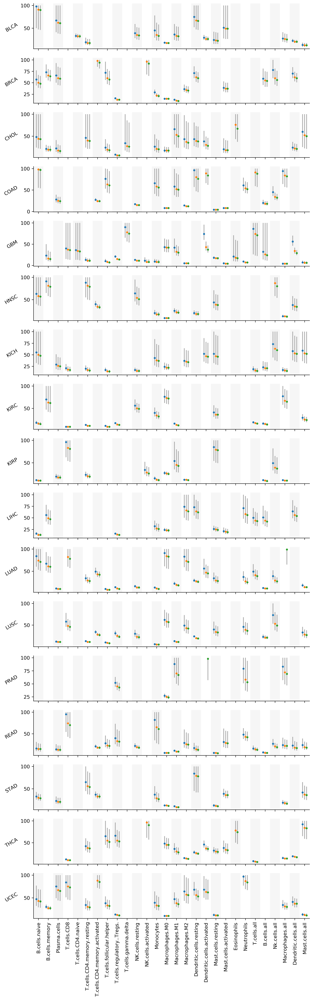

In [89]:
offset_map = { 
 100: -0.2,
 384: -0.0,
 1000: 0.2
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2]}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.5

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 2 * len(plot_cancer_type_map)))

for cancer_type in plot_cancer_types:

    if len(axes) == 0:
        ax = fig.add_subplot(len(plot_cancer_types), 1, 1)
    else:
        ax = fig.add_subplot(len(plot_cancer_types), 1, len(axes) + 1, sharex = axes[0])
    
    axes.append(ax)

    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 5 or primary_n < 5: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        for cell_number in offset_map:
            x = x_map[cell_type] + offset_map[cell_number]
            y = sensei.optimize.find_minimum_M(100, cell_number, 
                                               [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                               beta=0.2, design='unpaired')
            
            if isnan(y):
                continue
            
            if (primary_mean - normal_mean > 0 and lower_diff > 0 and upper_diff > 0) or \
               (primary_mean - normal_mean < 0 and lower_diff < 0 and upper_diff < 0):
                
                abs_lower_diff, abs_upper_diff = sorted([abs(lower_diff), abs(upper_diff)])
                
                y_lower = sensei.optimize.find_minimum_M_override(100, cell_number, 
                                                              [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                                              beta=0.2, design='unpaired', override_diff = abs_upper_diff)
                y_upper = sensei.optimize.find_minimum_M_override(100, cell_number, 
                                                              [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                                              beta=0.2, design='unpaired', override_diff = abs_lower_diff)
                
                # print(cancer_type, cell_type, cell_number, 
                #      y_lower, y_upper, lower_diff, upper_diff, 
                #      normal_n, primary_n, normal_mean, primary_mean, normal_sd, primary_sd)
                
                if isnan(y_upper):
                    y_upper = 100
                ax.errorbar(x, y, yerr=[[y - y_lower], [y_upper - y]], fmt='.', color = color_map[cell_number], 
                            ecolor = 'darkgray', elinewidth=1.5)
            else:
                ax.errorbar(x, y, yerr=0, fmt='D', color = color_map[cell_number], ecolor = 'darkgray', 
                            elinewidth=1.5, markersize=2)
            
                
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')


    current_ylim = ax.get_ylim()
    for i in list(cancer_type_map.values()):
        if i % 2 == 0:
            ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

    ax.set_ylim(current_ylim)
    ax.set_xlim(-0.5, len(plot_cell_type_map) - 0.5)
    ax.set_xticks(list(plot_cell_type_map.values()))
    ax.tick_params(axis='x', which = 'both', labelbottom=None)
    ax.set_ylabel(cancer_type, rotation = 30, ha = 'right')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.set_xticklabels(list(plot_cell_type_map.keys()), rotation=90)

[Text(0, 0, 'B.cells.naive'),
 Text(0, 0, 'B.cells.memory'),
 Text(0, 0, 'Plasma.cells'),
 Text(0, 0, 'T.cells.CD8'),
 Text(0, 0, 'T.cells.CD4.naive'),
 Text(0, 0, 'T.cells.CD4.memory.resting'),
 Text(0, 0, 'T.cells.CD4.memory.activated'),
 Text(0, 0, 'T.cells.follicular.helper'),
 Text(0, 0, 'T.cells.regulatory..Tregs.'),
 Text(0, 0, 'T.cells.gamma.delta'),
 Text(0, 0, 'NK.cells.resting'),
 Text(0, 0, 'NK.cells.activated'),
 Text(0, 0, 'Monocytes'),
 Text(0, 0, 'Macrophages.M0'),
 Text(0, 0, 'Macrophages.M1'),
 Text(0, 0, 'Macrophages.M2'),
 Text(0, 0, 'Dendritic.cells.resting'),
 Text(0, 0, 'Dendritic.cells.activated'),
 Text(0, 0, 'Mast.cells.resting'),
 Text(0, 0, 'Mast.cells.activated'),
 Text(0, 0, 'Eosinophils'),
 Text(0, 0, 'Neutrophils'),
 Text(0, 0, 'T.cells.all'),
 Text(0, 0, 'B.cells.all'),
 Text(0, 0, 'Nk.cells.all'),
 Text(0, 0, 'Macrophages.all'),
 Text(0, 0, 'Dendritic.cells.all'),
 Text(0, 0, 'Mast.cells.all')]

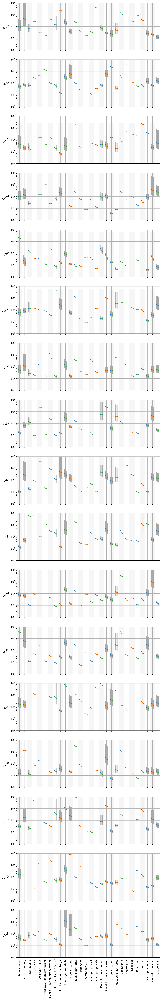

In [41]:
offset_map = { 
 100: -0.2,
 384: -0.0,
 1000: 0.2
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2]}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_markers = {
    
}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 4 * len(plot_cancer_type_map)))

for cancer_type in plot_cancer_types:

    if len(axes) == 0:
        ax = fig.add_subplot(len(plot_cancer_types), 1, 1)
    else:
        ax = fig.add_subplot(len(plot_cancer_types), 1, len(axes) + 1, sharex = axes[0])
    
    axes.append(ax)

    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 5 or primary_n < 5: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        for cell_number in offset_map:
            x = x_map[cell_type] + offset_map[cell_number]
            y = sensei.optimize.find_minimum_M(10000, cell_number, 
                                               [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                               beta=0.2, design='unpaired')
            
            if isnan(y):
                continue
            
            if (primary_mean - normal_mean > 0 and lower_diff > 0 and upper_diff > 0) or \
               (primary_mean - normal_mean < 0 and lower_diff < 0 and upper_diff < 0):
                
                abs_lower_diff, abs_upper_diff = sorted([abs(lower_diff), abs(upper_diff)])
                
                y_lower = sensei.optimize.find_minimum_M_override(10000, cell_number, 
                                                              [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                                              beta=0.2, design='unpaired', override_diff = abs_upper_diff)
                y_upper = sensei.optimize.find_minimum_M_override(10000, cell_number, 
                                                              [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                                              beta=0.2, design='unpaired', override_diff = abs_lower_diff)
                
                # print(cancer_type, cell_type, cell_number, 
                #      y_lower, y_upper, lower_diff, upper_diff, primary_mean - normal_mean)
                
                if isnan(y_upper):
                    y_upper = 10000
                ax.errorbar(x, y, yerr=[[y - y_lower], [y_upper - y]], fmt='.', color = color_map[cell_number], 
                            ecolor = 'darkgray', elinewidth=1.5)
            else:
                ax.errorbar(x, y, yerr=0, fmt='D', color = color_map[cell_number], ecolor = 'darkgray', 
                            elinewidth=1.5, markersize=2)
            
                
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')


    current_ylim = ax.get_ylim()
    for i in list(cancer_type_map.values()):
        if i % 2 == 0:
            ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

    ax.set_ylim(current_ylim)
    ax.set_xlim(-0.5, len(plot_cell_type_map) - 0.5)
    ax.set_xticks(list(plot_cell_type_map.values()))
    ax.tick_params(axis='x', which = 'both', labelbottom=None)
    ax.set_ylabel(cancer_type, rotation = 30, ha = 'right')
    ax.set_ylim([1, 10000])
    ax.set_yscale('log')
    plt.grid()
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.set_xticklabels(list(plot_cell_type_map.keys()), rotation=90)

BLCA B.cells.naive 0.05490631565022143 0.056343700977206035 0.027156794581616274 0.03267583725566836 0.06189002084826148 0.005979200594732943
BLCA B.cells.memory 0.036333772074423176 0.04984552036704828 0.02402477178361642 0.04672946379951533 0.06715672980180964 0.006488017830140695
BLCA Plasma.cells 0.028509153695483357 0.04315863806588191 0.02080179768190299 0.053245046473314746 0.06286838028129997 0.006073719989357621
BLCA T.cells.CD8 0.14677688521572493 0.10143228884866204 0.04888879829389716 0.1262090356752895 0.08328961062709184 0.008046616927429456
BLCA T.cells.CD4.naive 0.0 0.0 0.0 0.032912557150936446 0.07181902240792823 0.006938442346746854
BLCA T.cells.CD4.memory.resting 0.1043469280738745 0.07414003649468169 0.035734353733243976 0.04427720210031711 0.05943933148959352 0.005742439270855238
BLCA T.cells.CD4.memory.activated 0.0052823665638573195 0.022292012532887148 0.010744406112252714 0.009272917832720624 0.02200711765038967 0.0021261096561298706
BLCA T.cells.follicular.hel

CHOL B.cells.naive 0.07240142390266532 0.05278648937996965 0.0405752875947017 0.04101130045722269 0.06086504430513197 0.020593768166192794
CHOL B.cells.memory 0.0017022781573599998 0.005106834472079999 0.003925460469849146 0.039012505243492174 0.06150664791403456 0.02081085559506399
CHOL Plasma.cells 0.05238157556074268 0.026903858286548364 0.020680136152377446 0.026929154513820712 0.026643256313102843 0.009014780979272679
CHOL T.cells.CD8 0.11429778228918577 0.04137087388944558 0.03180046875300187 0.11459099144357172 0.08598337495461897 0.029092588532182315
CHOL T.cells.CD4.naive 0.0 0.0 0.0 0.004280913635994085 0.021338873969302542 0.007220036204169324
CHOL T.cells.CD4.memory.resting 0.15688708246500477 0.06340441209908111 0.0487369454932803 0.1133995839333965 0.08592740219105993 0.029073650073671103
CHOL T.cells.CD4.memory.activated 0.0 0.0 0.0 0.00030037328529959834 0.0012624931623086307 0.0004271662296940996
CHOL T.cells.follicular.helper 0.03080420633435392 0.023769782614639093 0

GBM T.cells.gamma.delta 0.0 0.0 0.0 0.0036094143375524374 0.012269348051251463 0.001934202665433784
GBM NK.cells.resting 0.00304145849593666 0.00680090794765864 0.0084444425537056 0.04088912671428129 0.045154548815222524 0.007118393602499109
GBM NK.cells.activated 0.0566316006412111 0.029727301358102844 0.03691131986011024 0.019184006593540553 0.023227440910607074 0.0036616923680732535
GBM Monocytes 0.18299539512156496 0.07957522888046056 0.0988056968496925 0.08303382547511519 0.0618772830270804 0.009754650798138535
GBM Macrophages.M0 0.00911654297467816 0.014584817852561978 0.018109443247885777 0.04780945851653636 0.09674114844298573 0.015250768532600443
GBM Macrophages.M1 0.004341150970376606 0.004407090048429576 0.0054721250499770975 0.013243883580120127 0.018013399927989608 0.0028397243283589486
GBM Macrophages.M2 0.26508892757574387 0.12627269053574525 0.15678825379456035 0.5034516708321156 0.1157656599717172 0.01824988965572278
GBM Dendritic.cells.resting 0.0 0.0 0.0 0.0005613024

KICH Mast.cells.resting 0.06407806210416356 0.06556102204821938 0.027062259820836588 0.1020519573522509 0.07783627898325332 0.01913454560568171
KICH Mast.cells.activated 0.010149365631781282 0.02062260271126785 0.008512592014562366 0.006095915625164557 0.03196969677501681 0.007859132385721945
KICH Eosinophils 0.0028447056066566263 0.009812980770695286 0.004050599379584285 0.0027555009346822575 0.007590962535610677 0.0018660915029084907
KICH Neutrophils 0.006688526838711514 0.012020194335529968 0.004961692359917917 0.0029126299098490628 0.009986457847841015 0.002454977751054166
KICH T.cells.all 0.32136164175047155 0.06657224193563338 0.027479670875061264 0.24242480298745847 0.09548711267012533 0.023473662102147595
KICH B.cells.all 0.1348675866645737 0.11277866064535828 0.046552743097657924 0.06229060995439406 0.06013677345743672 0.014783464077817055
KICH Nk.cells.all 0.06573001730667337 0.03657795219478974 0.015098636584425007 0.08986046411573119 0.06376696017438709 0.01567587535697869


KIRP Mast.cells.activated 0.015584899066442915 0.03361144110169739 0.0121182167784903 0.006855732902893463 0.030375962286160157 0.0035107644615942715
KIRP Eosinophils 0.00048920422298907 0.0016754345203835056 0.0006040585601415323 0.00042129929992240736 0.002550459591835092 0.0002947746251260822
KIRP Neutrophils 0.0055435463302387815 0.021238054448450356 0.007657135169568926 0.007151652813737652 0.01575208137122092 0.0018205792775631703
KIRP T.cells.all 0.3057209295169393 0.0745806836052395 0.02688920384822918 0.2845768922454741 0.11145558553402665 0.012881709064977414
KIRP B.cells.all 0.17676601050876695 0.08917796555235159 0.03215208521284029 0.07707597011730474 0.0694009333371646 0.008021155941209545
KIRP Nk.cells.all 0.0683412263252234 0.04131726269814138 0.014896461730247655 0.0463169047061906 0.03107214521453 0.003591227238729173
KIRP Macrophages.all 0.2818743962169642 0.07005851338393787 0.0252587876192684 0.4372795810219988 0.16495558358630666 0.019065081630688173
KIRP Dendriti

LUSC B.cells.naive 0.06397212522313517 0.03810191894514126 0.01071633737713019 0.06736649587800254 0.06256329126742087 0.005475183318440822
LUSC B.cells.memory 0.008609003603393965 0.035095274026027495 0.009870704867837213 0.013272035595277775 0.028274090842970515 0.0024743875744293836
LUSC Plasma.cells 0.02597494706933263 0.030071825790726082 0.008457837285930187 0.09378922098282758 0.0775955619113351 0.006790722124032815
LUSC T.cells.CD8 0.08567731735160351 0.03399065091368598 0.009560024611457718 0.11320771848861737 0.06401918230363322 0.005602594619116563
LUSC T.cells.CD4.naive 0.0002868393291286843 0.002048442539463745 0.000576133747546017 0.0019063537111820824 0.009628793508772979 0.0008426572280317055
LUSC T.cells.CD4.memory.resting 0.15414135404361062 0.05947768982882399 0.01672836981086648 0.08013697116459002 0.06806795977232254 0.0059569205889875
LUSC T.cells.CD4.memory.activated 0.0006260966961054971 0.0025407989471642255 0.0007146112185181984 0.010029226565023901 0.01854510

READ T.cells.regulatory..Tregs. 0.01932603149519858 0.019995648293094102 0.014304025095463628 0.037542930257173465 0.03408378133866125 0.005223227060605124
READ T.cells.gamma.delta 0.0004928573871381479 0.0015585519049959235 0.001114920868524371 0.0005557107361925238 0.00499211310510043 0.0007650248662575832
READ NK.cells.resting 0.004798289905202408 0.006808761592822352 0.004870694626410104 0.02451503838742929 0.030941770899981198 0.004741724325185273
READ NK.cells.activated 0.019006613668408702 0.017327987209877483 0.012395695316843702 0.02060366523311033 0.028413202635337264 0.004354229579422
READ Monocytes 0.029387438362635254 0.027087700270681307 0.01937737345500523 0.01843265418943775 0.019592861436761515 0.003002541385720525
READ Macrophages.M0 0.0 0.0 0.0 0.12302542944254684 0.09738686643557126 0.014924216038694739
READ Macrophages.M1 0.009636557648132666 0.0073757889775104765 0.005276321581910981 0.04608059445981656 0.03729355913265365 0.0057151149196876345
READ Macrophages.M2

THCA B.cells.all 0.1462750697585762 0.10162131074896102 0.02648265780261296 0.12779307281714133 0.08766349992310646 0.007664174487431535
THCA Nk.cells.all 0.06695005187367782 0.03324180315735165 0.008662861079726462 0.05559624791237888 0.03567782512615039 0.0031192124126772597
THCA Macrophages.all 0.24326226351308866 0.10315482638507373 0.026882294153756404 0.36578755333945784 0.13646968919979222 0.011931163040378124
THCA Dendritic.cells.all 0.005933762793909374 0.008947809525075569 0.002331811861007311 0.0378090170619332 0.04900137186220134 0.004284052820214171
THCA Mast.cells.all 0.03694246010362871 0.044270101208164096 0.01153685120317973 0.059276154876117274 0.06720369333524051 0.005875430850615202
THCA Leukocytes.all 0.9999999999999999 6.119263928699209e-16 1.594688864306653e-16 1.0 5.529485313139694e-16 4.834274276382425e-17
UCEC B.cells.naive 0.0700110258787025 0.05778517485981435 0.019849902069321804 0.039166440813930524 0.05256017345312496 0.0043744524464347
UCEC B.cells.memor

[Text(0, 0, 'B.cells.naive'),
 Text(0, 0, 'B.cells.memory'),
 Text(0, 0, 'Plasma.cells'),
 Text(0, 0, 'T.cells.CD8'),
 Text(0, 0, 'T.cells.CD4.naive'),
 Text(0, 0, 'T.cells.CD4.memory.resting'),
 Text(0, 0, 'T.cells.CD4.memory.activated'),
 Text(0, 0, 'T.cells.follicular.helper'),
 Text(0, 0, 'T.cells.regulatory..Tregs.'),
 Text(0, 0, 'T.cells.gamma.delta'),
 Text(0, 0, 'NK.cells.resting'),
 Text(0, 0, 'NK.cells.activated'),
 Text(0, 0, 'Monocytes'),
 Text(0, 0, 'Macrophages.M0'),
 Text(0, 0, 'Macrophages.M1'),
 Text(0, 0, 'Macrophages.M2'),
 Text(0, 0, 'Dendritic.cells.resting'),
 Text(0, 0, 'Dendritic.cells.activated'),
 Text(0, 0, 'Mast.cells.resting'),
 Text(0, 0, 'Mast.cells.activated'),
 Text(0, 0, 'Eosinophils'),
 Text(0, 0, 'Neutrophils'),
 Text(0, 0, 'T.cells.all'),
 Text(0, 0, 'B.cells.all'),
 Text(0, 0, 'Nk.cells.all'),
 Text(0, 0, 'Macrophages.all'),
 Text(0, 0, 'Dendritic.cells.all'),
 Text(0, 0, 'Mast.cells.all'),
 Text(0, 0, 'Leukocytes.all')]

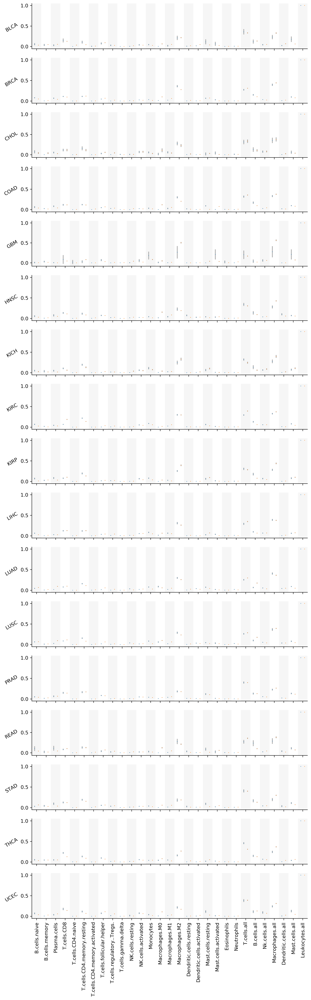

In [42]:
offset_map = { 
 'normal': -0.2,
 'primary': 0.2
}

color_map = {
 'normal': colors[0],
 'primary': colors[1]}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.05

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 2 * len(plot_cancer_type_map)))

for cancer_type in plot_cancer_types:

    if len(axes) == 0:
        ax = fig.add_subplot(len(plot_cancer_types), 1, 1)
    else:
        ax = fig.add_subplot(len(plot_cancer_types), 1, len(axes) + 1, sharex = axes[0])
    
    axes.append(ax)

    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 5 or primary_n < 5: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd / np.sqrt(primary_n)
        
        lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        print(cancer_type, cell_type, normal_mean, normal_sd, normal_err, primary_mean, primary_sd, primary_err)
        
        x = x_map[cell_type] + offset_map['primary']
        y = primary_mean
        yerr = primary_err
        ax.errorbar(x, y, yerr=yerr, fmt='_', color = color_map['primary'], 
                        ecolor = 'darkgray', elinewidth=1.5, markersize = 1)
            
        x = x_map[cell_type] + offset_map['normal']
        y = normal_mean
        yerr = normal_err
        ax.errorbar(x, y, yerr=yerr, fmt='_', color = color_map['normal'], 
                        ecolor = 'darkgray', elinewidth=1.5, markersize = 1)
                
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')


    current_ylim = ax.get_ylim()
    for i in list(cancer_type_map.values()):
        if i % 2 == 0:
            ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

    ax.set_ylim(current_ylim)
    ax.set_xlim(-0.5, len(plot_cell_type_map) - 0.5)
    ax.set_xticks(list(plot_cell_type_map.values()))
    ax.tick_params(axis='x', which = 'both', labelbottom=None)
    ax.set_ylabel(cancer_type, rotation = 30, ha = 'right')

# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.set_xticklabels(list(plot_cell_type_map.keys()), rotation=90)

In [43]:
# 35 557 0.2395481169321624 0.31098126541013593 0.0768367558857955 0.13122703195044785
diff_ci([35, 557], [0.2395481169321624, 0.31098126541013593], [0.0768367558857955, 0.13122703195044785])

[0.043019389224756815, 0.09984690773119023]

In [44]:
0.31098126541013593 - 0.2395481169321624

0.07143314847797352

In [45]:
def diff_ci_show(n, m, s, alpha = .05):
    nu = (s[0] ** 2 / n[0] + s[1] ** 2 / n[1]) ** 2 / \
         ((s[0] ** 2 / n[0]) ** 2 / (n[0] - 1) + (s[1] ** 2 / n[1]) ** 2 / (n[1] - 1))
    sp = (s[0] ** 2 / n[0] + s[1] ** 2 / n[1]) ** .5
    diff = m[1] - m[0]
    err = scipy.stats.t.ppf(1 - a / 2, nu) * sp
    print(nu, sp, diff, err)
    return [diff - err, diff + err]

In [46]:
diff_ci_show([35, 557], [0.2395481169321624, 0.31098126541013593], [0.0768367558857955, 0.13122703195044785])

47.50777700919784 0.014127953327737456 0.07143314847797352 0.028413759253216708


[0.043019389224756815, 0.09984690773119023]

In [47]:
scipy.stats.t.ppf(1 - a / 2, 35 - 1) * 0.0768367558857955 / np.sqrt(35)

0.026394349127739688

In [48]:
scipy.stats.t.ppf(1 - a / 2, 557 - 1) * 0.13122703195044785 / np.sqrt(557)

0.010921699325554096

In [49]:
0.07143314847797352 - 0.026394349127739688 - 0.010921699325554096

0.034117100024679735

In [50]:
#100 3 3  0.005736739936882695 41 503 0.0 0.004033960400126621 0.0 0.019437749591925096
sensei.unpaired.calc_fn_rate(3, 100, [0.0, 0.0], [0.004033960400126621, 0.0023311808633705465], 
                            alpha=0.05, test_type="one-sided", offset = 0, sign = 0)

0.95

[Text(0, 0, 'Naive B'),
 Text(0, 0, 'Memory B'),
 Text(0, 0, 'Plasma'),
 Text(0, 0, 'CD8 T'),
 Text(0, 0, 'Naive CD4 T'),
 Text(0, 0, 'Resting memory CD4 T'),
 Text(0, 0, 'Activated memory CD4 T'),
 Text(0, 0, 'Follicular helper T'),
 Text(0, 0, 'Regulatory T'),
 Text(0, 0, 'Gamma-delta T'),
 Text(0, 0, 'Resting NK'),
 Text(0, 0, 'Activated NK'),
 Text(0, 0, 'Monocytes'),
 Text(0, 0, 'M0 Macrophages'),
 Text(0, 0, 'M1 Macrophages'),
 Text(0, 0, 'M2 Macrophages'),
 Text(0, 0, 'Resting dendritic'),
 Text(0, 0, 'Activated dendritic'),
 Text(0, 0, 'Resting mast'),
 Text(0, 0, 'Activated mast'),
 Text(0, 0, 'Eosinophils'),
 Text(0, 0, 'Neutrophils'),
 Text(0, 0, 'T cells'),
 Text(0, 0, 'B cells'),
 Text(0, 0, 'NK cells'),
 Text(0, 0, 'Macrophages'),
 Text(0, 0, 'Dendritic cells'),
 Text(0, 0, 'Mast cells')]

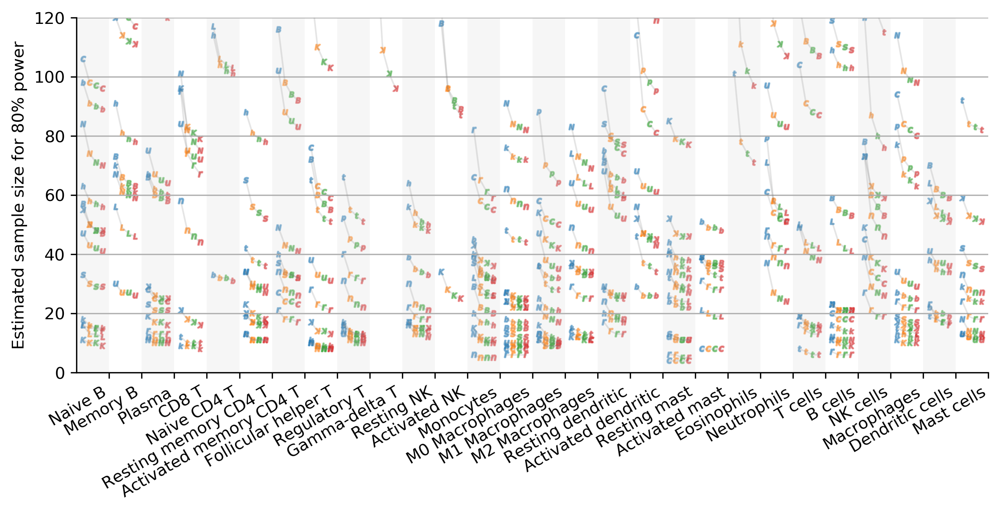

In [51]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_markers = {
 'BLCA': 'b',
 'BRCA': 'B',
 'CHOL': 'l',
 'COAD': 'c',
 'GBM': 'g',
 'HNSC': 'h',
 'KICH': 'ꓘ',
 'KIRC': 'k',
 'KIRP': 'K',
 'LIHC': 'L',
 'LUAD': 'N',
 'LUSC': 'n',
 'PRAD': 'p',
 'READ': 'r',
 'STAD': 's',
 'THCA': 't',
 'UCEC': 'u'
}



plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot('111')

for cancer_type in plot_cancer_types:
    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 10 or primary_n < 10: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        if normal_mean == 0: normal_mean = 1e-12
        if normal_mean == 1: normal_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if normal_sd == 0: normal_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(10000, cell_number,  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                            beta=0.2, 
                                            design='unpaired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        c = [color_map[cell_number] for cell_number in offset_map]
        ax.plot(x, y, c='gray', lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .5)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(cancer_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) - 0.5)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([0, 120])
#ax.set_yscale('log')
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

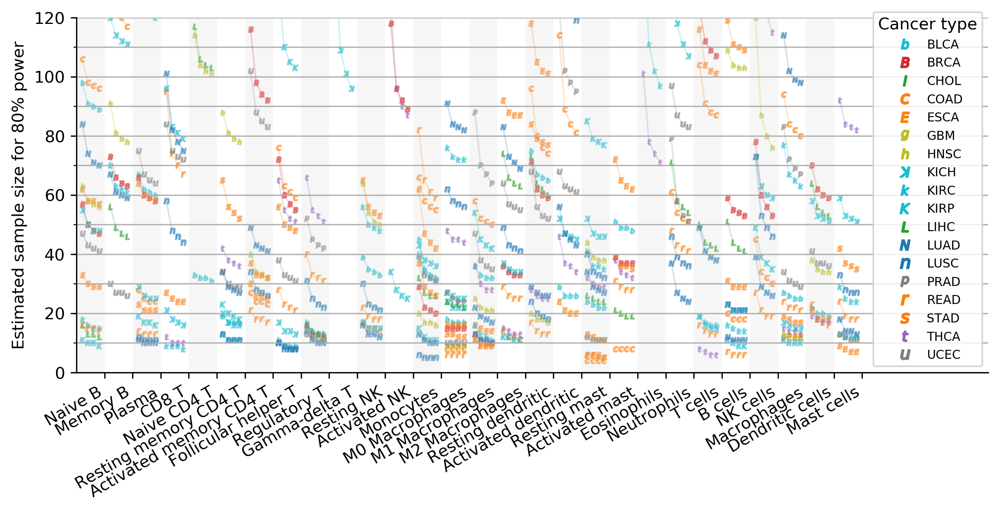

In [52]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'ESCA',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_markers = {
 'BLCA': 'b',
 'BRCA': 'B',
 'CHOL': 'l',
 'COAD': 'c',
 'ESCA': "E",
 'GBM': 'g',
 'HNSC': 'h',
 'KICH': 'ꓘ',
 'KIRC': 'k',
 'KIRP': 'K',
 'LIHC': 'L',
 'LUAD': 'N',
 'LUSC': 'n',
 'PRAD': 'p',
 'READ': 'r',
 'STAD': 's',
 'THCA': 't',
 'UCEC': 'u'
}

plot_cancer_type_colors = {
 'BLCA': '#17becf',
 'BRCA': '#d62728',
 'CHOL': '#2ca02c',
 'COAD': '#ff7f0e',
 'ESCA': "#ff7f0e",
 'GBM': '#bcbd22',
 'HNSC': '#bcbd22',
 'KICH': '#17becf',
 'KIRC': '#17becf',
 'KIRP': '#17becf',
 'LIHC': '#2ca02c',
 'LUAD': '#1f77b4',
 'LUSC': '#1f77b4',
 'PRAD': '#7f7f7f',
 'READ': '#ff7f0e',
 'STAD': '#ff7f0e',
 'THCA': '#9467bd',
 'UCEC': '#7f7f7f'
}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot('111')

for cancer_type in plot_cancer_types:
    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 10 or primary_n < 10: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        if normal_mean == 0: normal_mean = 1e-12
        if normal_mean == 1: normal_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if normal_sd == 0: normal_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(10000, cell_number,  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                            beta=0.2, 
                                            design='unpaired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .5)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([0, 120])
#ax.set_yscale('log')

ax.yaxis.set_minor_locator(MultipleLocator(10))
ax.yaxis.set_major_locator(MultipleLocator(20))
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type', fontsize=7.5)

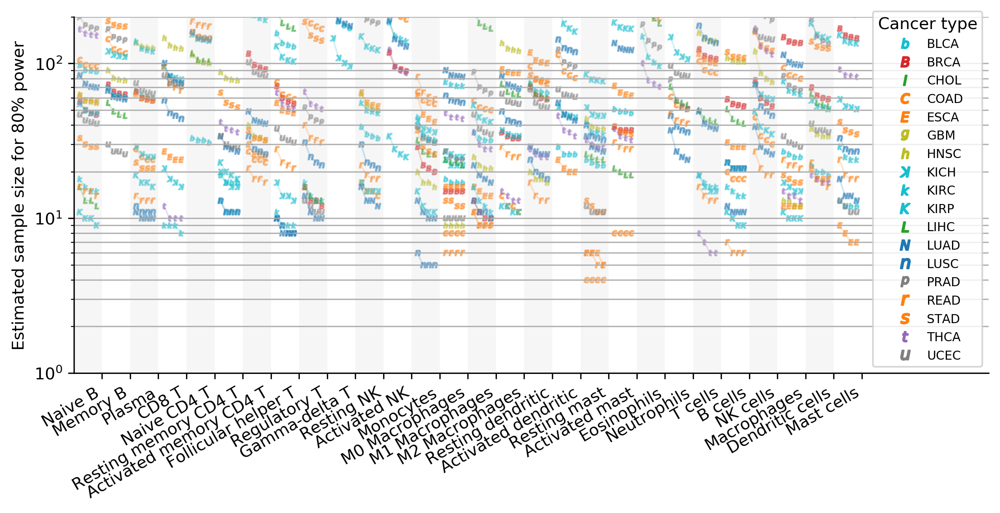

In [53]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'ESCA',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_markers = {
 'BLCA': 'b',
 'BRCA': 'B',
 'CHOL': 'l',
 'COAD': 'c',
 'ESCA': "E",
 'GBM': 'g',
 'HNSC': 'h',
 'KICH': 'ꓘ',
 'KIRC': 'k',
 'KIRP': 'K',
 'LIHC': 'L',
 'LUAD': 'N',
 'LUSC': 'n',
 'PRAD': 'p',
 'READ': 'r',
 'STAD': 's',
 'THCA': 't',
 'UCEC': 'u'
}

plot_cancer_type_colors = {
 'BLCA': '#17becf',
 'BRCA': '#d62728',
 'CHOL': '#2ca02c',
 'COAD': '#ff7f0e',
 'ESCA': "#ff7f0e",
 'GBM': '#bcbd22',
 'HNSC': '#bcbd22',
 'KICH': '#17becf',
 'KIRC': '#17becf',
 'KIRP': '#17becf',
 'LIHC': '#2ca02c',
 'LUAD': '#1f77b4',
 'LUSC': '#1f77b4',
 'PRAD': '#7f7f7f',
 'READ': '#ff7f0e',
 'STAD': '#ff7f0e',
 'THCA': '#9467bd',
 'UCEC': '#7f7f7f'
}

unpaired_dicts = {k: pd.DataFrame(columns = plot_cell_types, index = [100, 384, 1000, float('inf')])for k in plot_cancer_types}

plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot('111')

mem_unpaired = {}

for cancer_type in plot_cancer_types:
    mem_unpaired[cancer_type] = {}
    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 10 or primary_n < 10: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        if normal_mean == 0: normal_mean = 1e-12
        if normal_mean == 1: normal_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if normal_sd == 0: normal_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(1000, cell_number,  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                            beta=0.2, 
                                            design='unpaired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map]
        
        unpaired_dicts[cancer_type][cell_type] = y
        
        mem_unpaired[cancer_type][cell_type] = y
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .5)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([1, 200])
ax.set_yscale('log')

#ax.yaxis.set_minor_locator(MultipleLocator(10))
#ax.yaxis.set_major_locator(MultipleLocator(20))
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type', fontsize=7.5)

with open("unpaired.pkl", 'wb') as f:
    pkl.dump(unpaired_dicts, f)

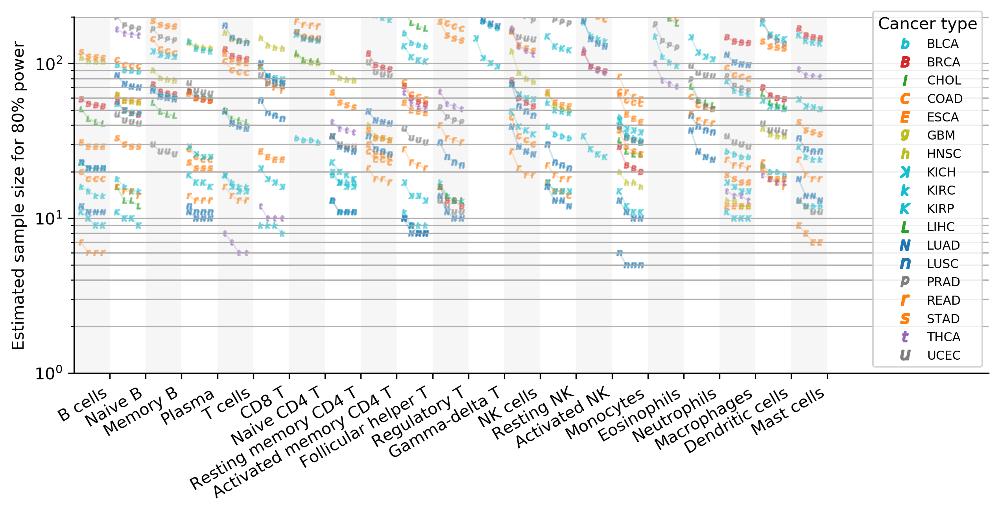

In [54]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = tcga_dicts.plot_cell_types

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'ESCA',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_markers = {
 'BLCA': 'b',
 'BRCA': 'B',
 'CHOL': 'l',
 'COAD': 'c',
 'ESCA': "E",
 'GBM': 'g',
 'HNSC': 'h',
 'KICH': 'ꓘ',
 'KIRC': 'k',
 'KIRP': 'K',
 'LIHC': 'L',
 'LUAD': 'N',
 'LUSC': 'n',
 'PRAD': 'p',
 'READ': 'r',
 'STAD': 's',
 'THCA': 't',
 'UCEC': 'u'
}

plot_cancer_type_colors = {
 'BLCA': '#17becf',
 'BRCA': '#d62728',
 'CHOL': '#2ca02c',
 'COAD': '#ff7f0e',
 'ESCA': "#ff7f0e",
 'GBM': '#bcbd22',
 'HNSC': '#bcbd22',
 'KICH': '#17becf',
 'KIRC': '#17becf',
 'KIRP': '#17becf',
 'LIHC': '#2ca02c',
 'LUAD': '#1f77b4',
 'LUSC': '#1f77b4',
 'PRAD': '#7f7f7f',
 'READ': '#ff7f0e',
 'STAD': '#ff7f0e',
 'THCA': '#9467bd',
 'UCEC': '#7f7f7f'
}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot('111')

mem_unpaired = {}

for cancer_type in plot_cancer_types:
    mem_unpaired[cancer_type] = {}
    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 10 or primary_n < 10: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        if normal_mean == 0: normal_mean = 1e-12
        if normal_mean == 1: normal_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if normal_sd == 0: normal_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(1000, cell_number,  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                            beta=0.2, 
                                            design='unpaired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        mem_unpaired[cancer_type][cell_type] = y
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .5)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([1, 200])
ax.set_yscale('log')

#ax.yaxis.set_minor_locator(MultipleLocator(10))
#ax.yaxis.set_major_locator(MultipleLocator(20))
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type', fontsize=7.5)

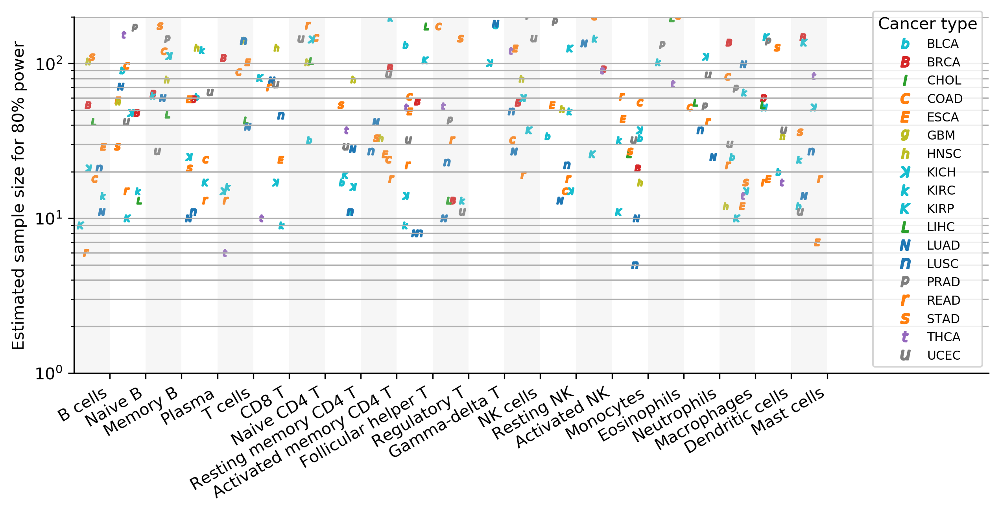

In [92]:
offset_map = { 
 1000: 0.0
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = tcga_dicts.plot_cell_types

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'ESCA',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_markers = {
 'BLCA': 'b',
 'BRCA': 'B',
 'CHOL': 'l',
 'COAD': 'c',
 'ESCA': "E",
 'GBM': 'g',
 'HNSC': 'h',
 'KICH': 'ꓘ',
 'KIRC': 'k',
 'KIRP': 'K',
 'LIHC': 'L',
 'LUAD': 'N',
 'LUSC': 'n',
 'PRAD': 'p',
 'READ': 'r',
 'STAD': 's',
 'THCA': 't',
 'UCEC': 'u'
}

plot_cancer_type_colors = {
 'BLCA': '#17becf',
 'BRCA': '#d62728',
 'CHOL': '#2ca02c',
 'COAD': '#ff7f0e',
 'ESCA': "#ff7f0e",
 'GBM': '#bcbd22',
 'HNSC': '#bcbd22',
 'KICH': '#17becf',
 'KIRC': '#17becf',
 'KIRP': '#17becf',
 'LIHC': '#2ca02c',
 'LUAD': '#1f77b4',
 'LUSC': '#1f77b4',
 'PRAD': '#7f7f7f',
 'READ': '#ff7f0e',
 'STAD': '#ff7f0e',
 'THCA': '#9467bd',
 'UCEC': '#7f7f7f'
}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot('111')

mem_unpaired = {}

for cancer_type in plot_cancer_types:
    mem_unpaired[cancer_type] = {}
    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 10 or primary_n < 10: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        if normal_mean == 0: normal_mean = 1e-12
        if normal_mean == 1: normal_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if normal_sd == 0: normal_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        x = [x_map[cell_type] + offset_map[cell_number] + np.random.uniform(-0.35, 0.35) for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(1000, cell_number,  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                            beta=0.2, 
                                            design='unpaired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        mem_unpaired[cancer_type][cell_type] = y
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=15, alpha = 1.)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([1, 200])
ax.set_yscale('log')

#ax.yaxis.set_minor_locator(MultipleLocator(10))
#ax.yaxis.set_major_locator(MultipleLocator(20))
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type', fontsize=7.5)

In [55]:
set(cancer_types) - set(plot_cancer_types)

{'ACC',
 'CESC',
 'DLBC',
 'LAML',
 'LGG',
 'MESO',
 'OV',
 'PAAD',
 'PCPG',
 'SARC',
 'SKCM',
 'TGCT',
 'THYM',
 'UCS',
 'UVM'}

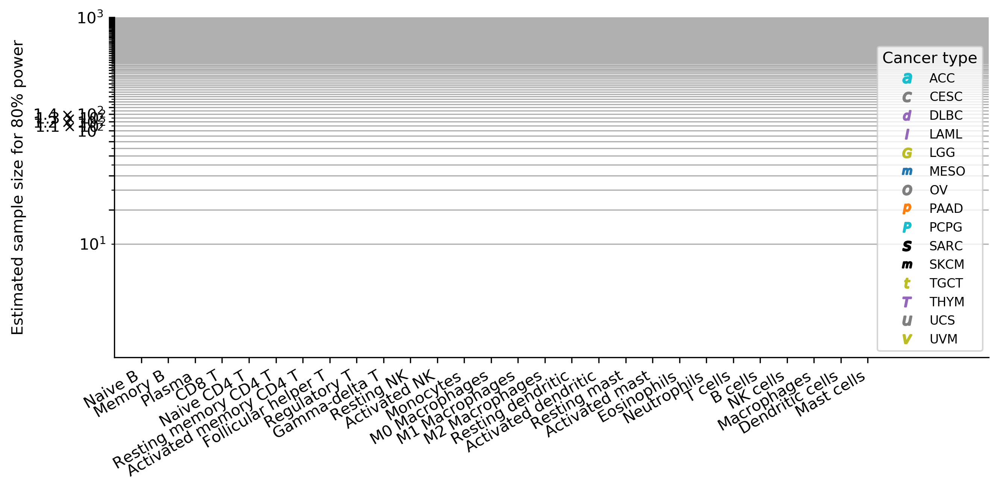

In [56]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'ACC',
 'CESC',
 'DLBC',
 'LAML',
 'LGG',
 'MESO',
 'OV',
 'PAAD',
 'PCPG',
 'SARC',
 'SKCM',
 'TGCT',
 'THYM',
 'UCS',
 'UVM']

plot_cancer_type_markers = {
 'ACC' : "a",
 'CESC': "c",
 'DLBC': "d",
 'LAML': "l",
 'LGG': "G",
 'MESO': "m",
 'OV': "o",
 'PAAD': "p",
 'PCPG': "P",
 'SARC': "s",
 'SKCM': "m",
 'TGCT': "t",
 'THYM': "T",
 'UCS': "u",
 'UVM': "v"
}

plot_cancer_type_colors = {
 'ACC' : "#17becf",
 'CESC': "#7f7f7f",
 'DLBC': '#9467bd',
 'LAML': "#9467bd",
 'LGG': "#bcbd22",
 'MESO': "#1f77b4",
 'OV' : "#7f7f7f",
 'PAAD' : "#ff7f0e",
 'PCPG' : "#17becf",
 'SARC' : "#000000",
 'SKCM' : "#000000",
 'TGCT' : "#bcbd22",
 'THYM' : "#9467bd",
 'UCS': "#7f7f7f",
 'UVM': "#bcbd22"
}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot('111')

for cancer_type in plot_cancer_types:
    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 10 or primary_n < 10: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        if normal_mean == 0: normal_mean = 1e-12
        if normal_mean == 1: normal_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if normal_sd == 0: normal_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(1000, cell_number,  [normal_mean, primary_mean], [normal_sd, primary_sd], 
                                            beta=0.2, 
                                            design='unpaired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .5)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([1, 1000])
ax.set_yscale('log')

ax.yaxis.set_minor_locator(MultipleLocator(10))
ax.yaxis.set_major_locator(MultipleLocator(20))
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type', fontsize=8)

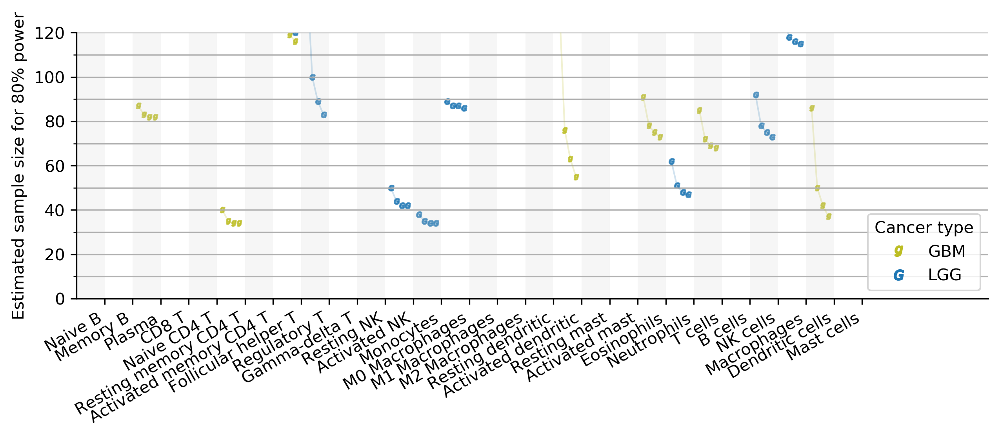

In [61]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'GBM', 'LGG'
]

plot_cancer_type_markers = {
 'GBM': 'g',
 'LGG': 'G',
}

plot_cancer_type_colors = {
 'GBM': '#bcbd22',
 'LGG': '#1f77b4',
}

recurrence_dicts = {k: pd.DataFrame(columns = plot_cell_types, index = [100, 384, 1000, float('inf')]) for k in plot_cancer_types}

plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 3))
ax = fig.add_subplot('111')

for cancer_type in plot_cancer_types:
    for cell_type in plot_cell_types:
        recurrent_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Recurrent Solid Tumor")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        recurrent_n = recurrent_mask.sum()
        primary_n = primary_mask.sum()
        
        if recurrent_n < 10 or primary_n < 10: 
            continue
        
        recurrent_mean = num_data[recurrent_mask][cell_type].mean(axis=0)
        recurrent_sd = num_data[recurrent_mask][cell_type].std(ddof=1, axis=0)
        
        # recurrent_err = scipy.stats.t.ppf(1 - a / 2, recurrent_n - 1) * recurrent_sd[:, j] / np.sqrt(recurrent_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if recurrent_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([recurrent_n, primary_n], [recurrent_mean, primary_mean], [recurrent_sd, primary_sd])
        
        if recurrent_mean == 0: recurrent_mean = 1e-12
        if recurrent_mean == 1: recurrent_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if recurrent_sd == 0: recurrent_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(10000, cell_number,  [recurrent_mean, primary_mean], [recurrent_sd, primary_sd], 
                                            beta=0.2, 
                                            design='unpaired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        recurrence_dicts[cancer_type][cell_type] = y;
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .8)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([0, 120])
#ax.set_yscale('log')

ax.yaxis.set_minor_locator(MultipleLocator(10))
ax.yaxis.set_major_locator(MultipleLocator(20))
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type')

with open("unpaired_recurrence.pkl", 'wb') as f:
    pkl.dump(recurrence_dicts, f)

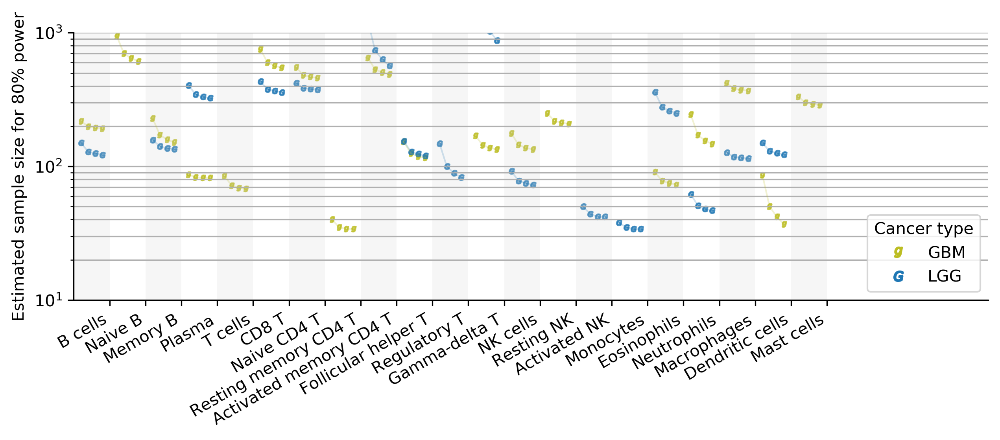

In [62]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = tcga_dicts.plot_cell_types

plot_cancer_types = [
 'GBM', 'LGG'
]

plot_cancer_type_markers = {
 'GBM': 'g',
 'LGG': 'G',
}

plot_cancer_types = list(plot_cancer_type_markers.keys())

plot_cancer_type_colors = {
 'GBM': '#bcbd22',
 'LGG': '#1f77b4',
}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 3))
ax = fig.add_subplot('111')

recur_unpaired = {}

for cancer_type in plot_cancer_types:
    recur_unpaired[cancer_type] = {}
    
    for cell_type in plot_cell_types:
        recurrent_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Recurrent Solid Tumor")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        recurrent_n = recurrent_mask.sum()
        primary_n = primary_mask.sum()
        
        if recurrent_n < 10 or primary_n < 10: 
            continue
        
        recurrent_mean = num_data[recurrent_mask][cell_type].mean(axis=0)
        recurrent_sd = num_data[recurrent_mask][cell_type].std(ddof=1, axis=0)
        
        # recurrent_err = scipy.stats.t.ppf(1 - a / 2, recurrent_n - 1) * recurrent_sd[:, j] / np.sqrt(recurrent_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if recurrent_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([recurrent_n, primary_n], [recurrent_mean, primary_mean], [recurrent_sd, primary_sd])
        
        if recurrent_mean == 0: recurrent_mean = 1e-12
        if recurrent_mean == 1: recurrent_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if recurrent_sd == 0: recurrent_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(10000, cell_number,  [recurrent_mean, primary_mean], [recurrent_sd, primary_sd], 
                                            beta=0.2, 
                                            design='unpaired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        recur_unpaired[cancer_type][cell_type] = y
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .8)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([10, 1000])
ax.set_yscale('log')
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type')

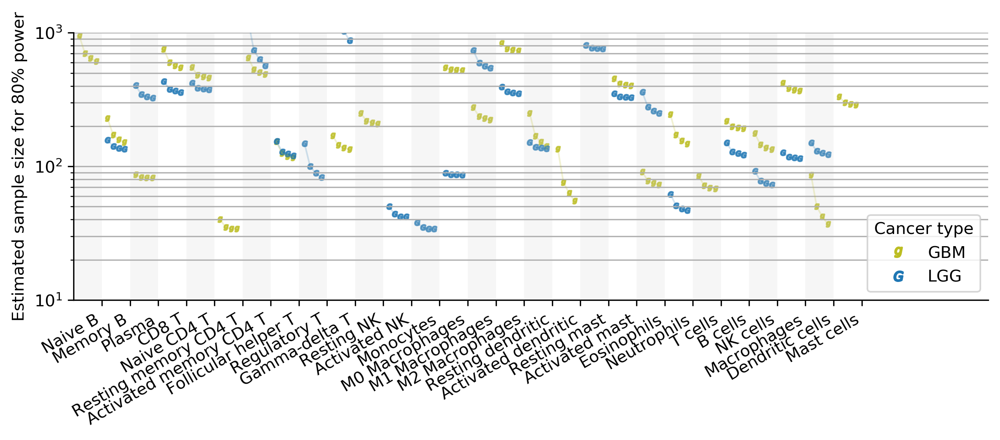

In [63]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'GBM', 'LGG'
]

plot_cancer_type_markers = {
 'GBM': 'g',
 'LGG': 'G',
}

plot_cancer_types = list(plot_cancer_type_markers.keys())

plot_cancer_type_colors = {
 'GBM': '#bcbd22',
 'LGG': '#1f77b4',
}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 3))
ax = fig.add_subplot('111')

recur_unpaired = {}

for cancer_type in plot_cancer_types:
    recur_unpaired[cancer_type] = {}
    
    for cell_type in plot_cell_types:
        recurrent_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Recurrent Solid Tumor")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        recurrent_n = recurrent_mask.sum()
        primary_n = primary_mask.sum()
        
        if recurrent_n < 10 or primary_n < 10: 
            continue
        
        recurrent_mean = num_data[recurrent_mask][cell_type].mean(axis=0)
        recurrent_sd = num_data[recurrent_mask][cell_type].std(ddof=1, axis=0)
        
        # recurrent_err = scipy.stats.t.ppf(1 - a / 2, recurrent_n - 1) * recurrent_sd[:, j] / np.sqrt(recurrent_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if recurrent_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([recurrent_n, primary_n], [recurrent_mean, primary_mean], [recurrent_sd, primary_sd])
        
        if recurrent_mean == 0: recurrent_mean = 1e-12
        if recurrent_mean == 1: recurrent_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if recurrent_sd == 0: recurrent_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(10000, cell_number,  [recurrent_mean, primary_mean], [recurrent_sd, primary_sd], 
                                            beta=0.2, 
                                            design='unpaired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        recur_unpaired[cancer_type][cell_type] = y
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .8)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([10, 1000])
ax.set_yscale('log')
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type')

## Paired

In [64]:
correlations = pd.read_csv("normal_primary.csv", index_col=0)
correlations

,BRCA,KIRC,THCA,LUAD,PRAD,LUSC,LIHC,HNSC,COAD,STAD,...,UCEC,BLCA,ESCA,CHOL,READ,PAAD,PCPG,CESC,SARC,THYM
B.cells.naive,0.335705,0.270752,0.424023,0.475894,0.251127,0.113961,-0.018670,0.103936,-0.019025,0.015289,...,0.091581,0.167204,0.187694,0.223172,0.016116,0.080583,-0.517289,-0.526565,-1.0,NaN
B.cells.memory,0.049975,0.150398,0.197809,-0.065622,0.024967,-0.042135,-0.107859,0.062362,-0.079223,-0.253838,...,-0.082492,0.325629,0.776672,-0.015473,-0.065909,-0.028731,0.695856,NaN,NaN,-1.000000
Plasma.cells,0.108794,0.064812,0.195367,0.312239,0.184174,0.327953,0.126047,0.002154,0.037638,0.097221,...,0.129735,-0.099803,0.159410,-0.122469,-0.022572,0.294727,0.421763,-0.251253,-1.0,-1.000000
T.cells.CD8,0.280467,-0.026212,-0.189805,0.193767,0.309294,0.053312,0.021696,0.001129,0.404048,0.277131,...,0.263120,0.493290,0.310241,-0.057436,-0.442134,0.342904,-0.281275,0.917529,-1.0,1.000000
T.cells.CD4.naive,NaN,NaN,-0.025627,NaN,NaN,-0.033259,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000
T.cells.CD4.memory.resting,0.192681,0.218822,0.378611,0.273195,0.326105,-0.012771,0.306619,0.167177,0.183860,0.399844,...,0.305834,0.476298,0.576347,-0.406114,-0.004678,-0.026473,-0.240013,0.783099,1.0,NaN
T.cells.CD4.memory.activated,0.008678,-0.024331,-0.032163,0.538777,NaN,0.013358,0.031265,-0.092630,-0.101773,-0.065375,...,NaN,0.733004,-0.198278,NaN,NaN,NaN,NaN,NaN,NaN,-1.000000
T.cells.follicular.helper,0.259855,0.208405,0.386401,0.117424,0.223766,0.094699,0.027962,-0.015315,0.235854,0.209784,...,0.103530,0.061697,0.351013,0.415264,0.062844,0.870471,0.999487,-0.796715,1.0,1.000000
T.cells.regulatory..Tregs.,0.068006,0.186400,0.141562,-0.037353,0.373800,0.129449,0.189308,0.427982,0.298618,0.134087,...,0.063575,0.317205,0.634402,-0.211093,-0.070629,0.549209,NaN,-0.824867,-1.0,-1.000000
T.cells.gamma.delta,0.009871,0.068901,-0.043286,NaN,NaN,NaN,-0.018865,-0.035755,-0.031656,NaN,...,-0.076575,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


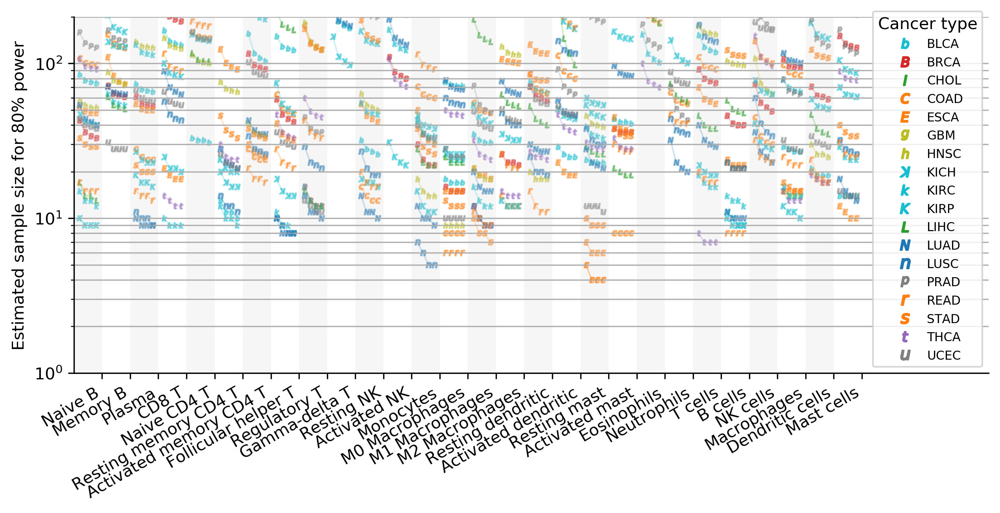

In [65]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'ESCA',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_markers = {
 'BLCA': 'b',
 'BRCA': 'B',
 'CHOL': 'l',
 'COAD': 'c',
 'ESCA': "E",
 'GBM': 'g',
 'HNSC': 'h',
 'KICH': 'ꓘ',
 'KIRC': 'k',
 'KIRP': 'K',
 'LIHC': 'L',
 'LUAD': 'N',
 'LUSC': 'n',
 'PRAD': 'p',
 'READ': 'r',
 'STAD': 's',
 'THCA': 't',
 'UCEC': 'u'
}

plot_cancer_type_colors = {
 'BLCA': '#17becf',
 'BRCA': '#d62728',
 'CHOL': '#2ca02c',
 'COAD': '#ff7f0e',
 'ESCA': "#ff7f0e",
 'GBM': '#bcbd22',
 'HNSC': '#bcbd22',
 'KICH': '#17becf',
 'KIRC': '#17becf',
 'KIRP': '#17becf',
 'LIHC': '#2ca02c',
 'LUAD': '#1f77b4',
 'LUSC': '#1f77b4',
 'PRAD': '#7f7f7f',
 'READ': '#ff7f0e',
 'STAD': '#ff7f0e',
 'THCA': '#9467bd',
 'UCEC': '#7f7f7f'
}

paired_dicts = {k: pd.DataFrame(columns = plot_cell_types, index = [100, 384, 1000, float('inf')])for k in plot_cancer_types}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot('111')

mem_paired = {}

for cancer_type in plot_cancer_types:
    mem_paired[cancer_type] = {}
    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 10 or primary_n < 10: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        rho = correlations.loc[cell_type, cancer_type]
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        if normal_mean == 0: normal_mean = 1e-12
        if normal_mean == 1: normal_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if normal_sd == 0: normal_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        if isnan(rho): rho = 0
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(10000, cell_number,  [normal_mean, primary_mean], [normal_sd, primary_sd], rho = rho,
                                            beta=0.2, 
                                            design='paired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        paired_dicts[cancer_type][cell_type] = y
        mem_paired[cancer_type][cell_type] = y
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .5)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([1, 200])
ax.set_yscale('log')

#ax.yaxis.set_minor_locator(MultipleLocator(10))
#ax.yaxis.set_major_locator(MultipleLocator(20))
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type', fontsize=7.5)

with open("paired.pkl", 'wb') as f:
    pkl.dump(paired_dicts, f)

In [68]:
rho

-0.19037664412522895

In [69]:
[sensei.optimize.find_minimum_M(10000, cell_number,  [normal_mean, primary_mean], [normal_sd, primary_sd], rho = rho,
                                            beta=0.2, 
                                            design='paired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 

[15, 14, 14, 14]

In [70]:
print(mem_unpaired['LIHC']['Dendritic.cells.all'])
print(mem_paired['LIHC']['Dendritic.cells.all'])

[64, 56, 54, 53]
[47, 38, 36, 35]


In [71]:
print(mem_unpaired['LIHC']['B.cells.all'])
print(mem_paired['LIHC']['B.cells.all'])

[51, 44, 42, 41]
[58, 51, 49, 48]


In [74]:
print(unpaired_dicts['BRCA']['B.cells.naive'])
print(paired_dicts['BRCA']['B.cells.naive'])

100.0     57
384.0     50
1000.0    48
inf       47
Name: B.cells.naive, dtype: int64
100.0     43
384.0     36
1000.0    34
inf       33
Name: B.cells.naive, dtype: int64


In [75]:
gbm_recur_corr = pd.read_csv("gbm.csv", index_col=0)
lgg_recur_corr = pd.read_csv("lgg.csv", index_col=0)

In [76]:
recur_corr = pd.DataFrame(data = {"GBM": gbm_recur_corr.Correlation, "LGG": lgg_recur_corr.Correlation})

In [77]:
recur_corr

,GBM,LGG
B.cells.naive,-0.489170,-0.199656
B.cells.memory,-0.035998,0.100203
Plasma.cells,-0.230582,0.735588
T.cells.CD8,-0.922153,0.332189
T.cells.CD4.naive,-0.200000,0.117568
T.cells.CD4.memory.resting,-0.531211,0.373645
T.cells.CD4.memory.activated,NaN,NaN
T.cells.follicular.helper,0.746183,0.190550
T.cells.regulatory..Tregs.,-0.215574,0.144958
T.cells.gamma.delta,NaN,NaN


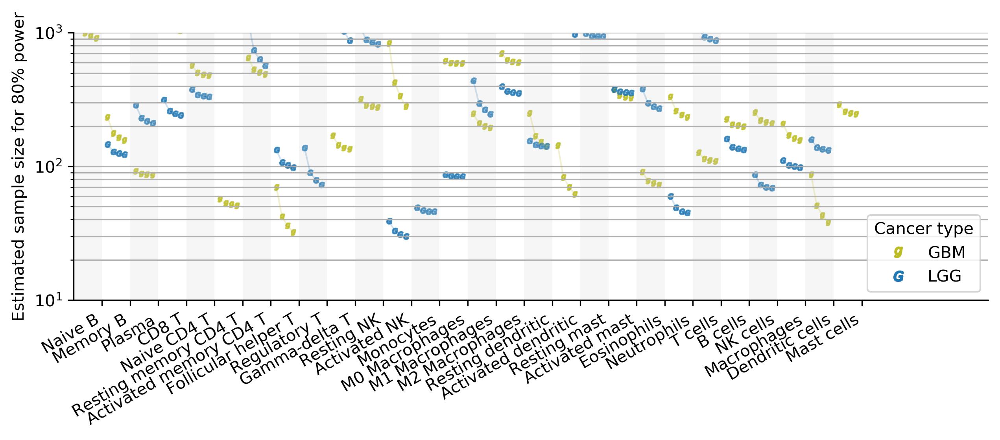

In [78]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = augmented_cell_types[:-1]

plot_cancer_types = [
 'GBM', 'LGG'
]

plot_cancer_type_markers = {
 'GBM': 'g',
 'LGG': 'G',
}

plot_cancer_types = list(plot_cancer_type_markers.keys())

plot_cancer_type_colors = {
 'GBM': '#bcbd22',
 'LGG': '#1f77b4',
}

paired_recurrence_dicts = {k: pd.DataFrame(columns = plot_cell_types, index = [100, 384, 1000, float('inf')])for k in plot_cancer_types}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 3))
ax = fig.add_subplot('111')

recur_paired = {}

for cancer_type in plot_cancer_types:
    recur_paired[cancer_type] = {}
    for cell_type in plot_cell_types:
        recurrent_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Recurrent Solid Tumor")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        recurrent_n = recurrent_mask.sum()
        primary_n = primary_mask.sum()
        
        if recurrent_n < 10 or primary_n < 10: 
            continue
        
        recurrent_mean = num_data[recurrent_mask][cell_type].mean(axis=0)
        recurrent_sd = num_data[recurrent_mask][cell_type].std(ddof=1, axis=0)
        
        # recurrent_err = scipy.stats.t.ppf(1 - a / 2, recurrent_n - 1) * recurrent_sd[:, j] / np.sqrt(recurrent_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if recurrent_mean == primary_mean:
            continue
        
        rho = recur_corr.loc[cell_type, cancer_type]
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([recurrent_n, primary_n], [recurrent_mean, primary_mean], [recurrent_sd, primary_sd])
        
        if recurrent_mean == 0: recurrent_mean = 1e-12
        if recurrent_mean == 1: recurrent_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if recurrent_sd == 0: recurrent_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        if isnan(rho): rho = 0
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(10000, cell_number,  [recurrent_mean, primary_mean], [recurrent_sd, primary_sd], 
                                            rho = rho,
                                            beta=0.2, 
                                            design='paired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        paired_recurrence_dicts[cancer_type][cell_type] = y
        recur_paired[cancer_type][cell_type] = y
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .8)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([10, 1000])
ax.set_yscale('log')
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type')

with open("paired-recurrence.pkl", 'wb') as f:
    pkl.dump(paired_recurrence_dicts, f)

In [82]:
paired_recurrence_dicts['LGG']

,B.cells.naive,B.cells.memory,Plasma.cells,T.cells.CD8,T.cells.CD4.naive,T.cells.CD4.memory.resting,T.cells.CD4.memory.activated,T.cells.follicular.helper,T.cells.regulatory..Tregs.,T.cells.gamma.delta,...,Mast.cells.resting,Mast.cells.activated,Eosinophils,Neutrophils,T.cells.all,B.cells.all,Nk.cells.all,Macrophages.all,Dendritic.cells.all,Mast.cells.all
100.0,4164,146,289,314,377,2863,1230,133,138,2457,...,988,379,380,60,1082,161,87,111,159,1670
384.0,3531,129,231,260,344,2441,739,107,90,1286,...,950,362,299,49,930,140,73,102,139,1470
1000.0,3394,125,219,248,337,2350,633,102,79,1032,...,941,358,281,46,897,136,70,100,135,1427
inf,3308,123,211,241,333,2293,567,98,73,874,...,936,356,271,45,877,133,69,98,132,1400


In [83]:
recurrence_dicts['LGG']

,B.cells.naive,B.cells.memory,Plasma.cells,T.cells.CD8,T.cells.CD4.naive,T.cells.CD4.memory.resting,T.cells.CD4.memory.activated,T.cells.follicular.helper,T.cells.regulatory..Tregs.,T.cells.gamma.delta,...,Mast.cells.resting,Mast.cells.activated,Eosinophils,Neutrophils,T.cells.all,B.cells.all,Nk.cells.all,Macrophages.all,Dendritic.cells.all,Mast.cells.all
100.0,3644,158,404,433,420,4206,1230,155,148,2457,...,810,350,360,62,1345,150,92,127,150,2369
384.0,3012,141,345,378,387,3785,739,129,100,1286,...,772,333,279,51,1193,129,78,118,130,2170
1000.0,2875,137,333,367,380,3693,633,124,89,1032,...,764,330,261,48,1160,125,75,116,126,2127
inf,2789,135,325,359,376,3636,567,120,83,874,...,759,327,250,47,1140,122,73,115,123,2100


In [84]:
paired_recurrence_dicts['GBM']

,B.cells.naive,B.cells.memory,Plasma.cells,T.cells.CD8,T.cells.CD4.naive,T.cells.CD4.memory.resting,T.cells.CD4.memory.activated,T.cells.follicular.helper,T.cells.regulatory..Tregs.,T.cells.gamma.delta,...,Mast.cells.resting,Mast.cells.activated,Eosinophils,Neutrophils,T.cells.all,B.cells.all,Nk.cells.all,Macrophages.all,Dendritic.cells.all,Mast.cells.all
100.0,1242,234,92,1250,570,57,652,70,3479,170,...,3285,377,91,332,127,226,253,208,87,290
384.0,998,177,88,1095,502,53,531,42,2769,144,...,3157,339,78,260,114,206,221,171,51,257
1000.0,945,164,87,1061,487,52,505,36,2615,138,...,3129,331,75,244,111,202,214,162,43,250
inf,912,157,86,1041,478,51,489,32,2519,135,...,3111,326,73,234,109,199,210,157,38,246


In [85]:
recurrence_dicts['GBM']

,B.cells.naive,B.cells.memory,Plasma.cells,T.cells.CD8,T.cells.CD4.naive,T.cells.CD4.memory.resting,T.cells.CD4.memory.activated,T.cells.follicular.helper,T.cells.regulatory..Tregs.,T.cells.gamma.delta,...,Mast.cells.resting,Mast.cells.activated,Eosinophils,Neutrophils,T.cells.all,B.cells.all,Nk.cells.all,Macrophages.all,Dendritic.cells.all,Mast.cells.all
100.0,944,229,87,756,551,40,652,153,3040,170,...,2366,454,91,245,85,219,177,420,86,332
384.0,699,172,83,601,483,35,531,125,2330,144,...,2238,416,78,172,72,199,145,382,50,300
1000.0,646,159,82,568,468,34,505,119,2176,138,...,2210,408,75,156,69,195,138,374,42,293
inf,613,151,82,547,459,34,489,116,2080,134,...,2192,403,73,147,68,192,134,369,37,288


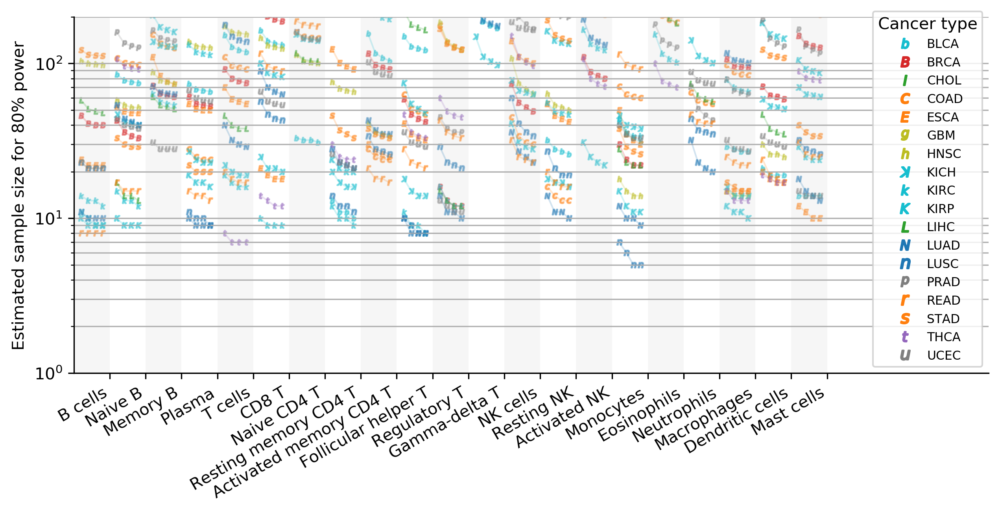

In [86]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = tcga_dicts.plot_cell_types

plot_cancer_types = [
 'BLCA',
 'BRCA',
 'CHOL',
 'COAD',
 'ESCA',
 'GBM',
 'HNSC',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'PRAD',
 'READ',
 'STAD',
 'THCA',
 'UCEC']

plot_cancer_type_markers = {
 'BLCA': 'b',
 'BRCA': 'B',
 'CHOL': 'l',
 'COAD': 'c',
 'ESCA': "E",
 'GBM': 'g',
 'HNSC': 'h',
 'KICH': 'ꓘ',
 'KIRC': 'k',
 'KIRP': 'K',
 'LIHC': 'L',
 'LUAD': 'N',
 'LUSC': 'n',
 'PRAD': 'p',
 'READ': 'r',
 'STAD': 's',
 'THCA': 't',
 'UCEC': 'u'
}

plot_cancer_type_colors = {
 'BLCA': '#17becf',
 'BRCA': '#d62728',
 'CHOL': '#2ca02c',
 'COAD': '#ff7f0e',
 'ESCA': "#ff7f0e",
 'GBM': '#bcbd22',
 'HNSC': '#bcbd22',
 'KICH': '#17becf',
 'KIRC': '#17becf',
 'KIRP': '#17becf',
 'LIHC': '#2ca02c',
 'LUAD': '#1f77b4',
 'LUSC': '#1f77b4',
 'PRAD': '#7f7f7f',
 'READ': '#ff7f0e',
 'STAD': '#ff7f0e',
 'THCA': '#9467bd',
 'UCEC': '#7f7f7f'
}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 4))
ax = fig.add_subplot('111')

mem_paired = {}

for cancer_type in plot_cancer_types:
    mem_paired[cancer_type] = {}
    for cell_type in plot_cell_types:
        normal_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Solid Tissue Normal")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        normal_n = normal_mask.sum()
        primary_n = primary_mask.sum()
        
        if normal_n < 10 or primary_n < 10: 
            continue
        
        normal_mean = num_data[normal_mask][cell_type].mean(axis=0)
        normal_sd = num_data[normal_mask][cell_type].std(ddof=1, axis=0)
        
        # normal_err = scipy.stats.t.ppf(1 - a / 2, normal_n - 1) * normal_sd[:, j] / np.sqrt(normal_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        rho = correlations.loc[cell_type, cancer_type]
        
        if normal_mean == primary_mean:
            continue
        
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([normal_n, primary_n], [normal_mean, primary_mean], [normal_sd, primary_sd])
        
        if normal_mean == 0: normal_mean = 1e-12
        if normal_mean == 1: normal_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if normal_sd == 0: normal_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        if isnan(rho): rho = 0
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(10000, cell_number,  [normal_mean, primary_mean], [normal_sd, primary_sd], rho = rho,
                                            beta=0.2, 
                                            design='paired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        mem_paired[cancer_type][cell_type] = y
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .5)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([1, 200])
ax.set_yscale('log')

#ax.yaxis.set_minor_locator(MultipleLocator(10))
#ax.yaxis.set_major_locator(MultipleLocator(20))
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type', fontsize=7.5)

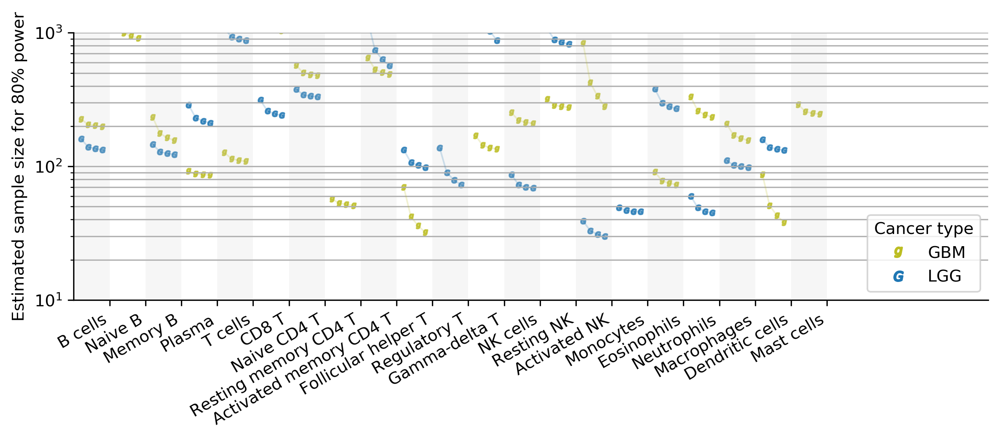

In [87]:
offset_map = { 
 100: -0.3,
 384: -0.1,
 1000: 0.1,
 float('inf'): 0.3
}

color_map = {
 100: colors[0],
 384: colors[1],
 1000: colors[2],
 float('inf'): colors[3]
}

# plot_cell_types = ['T.cells.all', 'B.cells.all', 'Nk.cells.all', 'Macrophages.all', 'Dendritic.cells.all', 'Mast.cells.all']

plot_cell_types = tcga_dicts.plot_cell_types

plot_cancer_types = [
 'GBM', 'LGG'
]

plot_cancer_type_markers = {
 'GBM': 'g',
 'LGG': 'G',
}

plot_cancer_types = list(plot_cancer_type_markers.keys())

plot_cancer_type_colors = {
 'GBM': '#bcbd22',
 'LGG': '#1f77b4',
}


plot_cancer_type_markers = {k: '$' + v + '$' for k, v in plot_cancer_type_markers.items()}

plot_cancer_type_map = {v: i for i, v in enumerate(plot_cancer_types)}

plot_cell_type_map = {v: i for i, v in enumerate(plot_cell_types)}
x_map = plot_cell_type_map

a = 0.4

num_data = all_data[augmented_cell_types]

sanitize = lambda x: 0.0 if x < 0 else 1.0 if x > 1 else x

axes = []

fig = plt.figure(figsize=(10, 3))
ax = fig.add_subplot('111')

recur_paired = {}

for cancer_type in plot_cancer_types:
    recur_paired[cancer_type] = {}
    for cell_type in plot_cell_types:
        recurrent_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Recurrent Solid Tumor")
        primary_mask = (all_data.CancerType == cancer_type) & (all_data.SampleType == "Primary Solid Tumor")
        recurrent_n = recurrent_mask.sum()
        primary_n = primary_mask.sum()
        
        if recurrent_n < 10 or primary_n < 10: 
            continue
        
        recurrent_mean = num_data[recurrent_mask][cell_type].mean(axis=0)
        recurrent_sd = num_data[recurrent_mask][cell_type].std(ddof=1, axis=0)
        
        # recurrent_err = scipy.stats.t.ppf(1 - a / 2, recurrent_n - 1) * recurrent_sd[:, j] / np.sqrt(recurrent_n)

        primary_mean = num_data[primary_mask][cell_type].mean(axis=0)
        primary_sd = num_data[primary_mask][cell_type].std(ddof=1, axis=0)
        
        if recurrent_mean == primary_mean:
            continue
        
        rho = recur_corr.loc[cell_type, cancer_type]
        # primary_err = scipy.stats.t.ppf(1 - a / 2, primary_n - 1) * primary_sd[:, j] / np.sqrt(primary_n)
        
        # lower_diff, upper_diff = diff_ci([recurrent_n, primary_n], [recurrent_mean, primary_mean], [recurrent_sd, primary_sd])
        
        if recurrent_mean == 0: recurrent_mean = 1e-12
        if recurrent_mean == 1: recurrent_mean = 1 - 1e-12
        if primary_mean == 0: primary_mean = 1e-12
        if primary_mean == 1: primary_mean = 1 - 1e-12
            
        if recurrent_sd == 0: recurrent_sd = 1e-12
        if primary_sd == 0: primary_sd = 1e-12
        
        if isnan(rho): rho = 0
        
        x = [x_map[cell_type] + offset_map[cell_number] for cell_number in offset_map]
        y = [sensei.optimize.find_minimum_M(10000, cell_number,  [recurrent_mean, primary_mean], [recurrent_sd, primary_sd], 
                                            rho = rho,
                                            beta=0.2, 
                                            design='paired' + ('-baseline' if cell_number == float('inf') else '')) 
             for cell_number in offset_map] 
        recur_paired[cancer_type][cell_type] = y
        #c = [color_map[cell_number] for cell_number in offset_map]
        c = plot_cancer_type_colors[cancer_type]
        ax.plot(x, y, c=c, lw=1, alpha=0.2)
        ax.scatter(x, y, marker=plot_cancer_type_markers[cancer_type], color=c, s=10, alpha = .8)

                
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


current_ylim = ax.get_ylim()
for i in list(plot_cell_type_map.values()):
    if i % 2 == 0:
        ax.fill_between([i - 0.5, i + 0.5], current_ylim[0], current_ylim[1], facecolor='lightgray', alpha=0.2)

ax.set_ylim(current_ylim)
ax.set_xlim(-0.5, len(plot_cell_type_map) + 4)
ax.set_xticks(list(plot_cell_type_map.values()))
ax.tick_params(axis='x', which = 'both', labelbottom=None)
ax.set_ylabel('Estimated sample size for 80% power')
ax.set_ylim([10, 1000])
ax.set_yscale('log')
ax.grid(axis='y', which='both')
    
# Ticks
ax.tick_params(axis='x', which = 'both', labelbottom=True)
ax.set_xticks(list(i + 0.5 for i in list(plot_cell_type_map.values())))
ax.set_xticklabels(list(cell_types_cosmetic_dict_short[i] for i in list(plot_cell_type_map.keys())), rotation=30, ha = 'right')

legend_elements = [mpl.lines.Line2D([0], [0], marker=plot_cancer_type_markers[cancer_type], 
                                    color=plot_cancer_type_colors[cancer_type], linestyle="None", label=cancer_type) 
                   for cancer_type in plot_cancer_types]

leg1 = ax.legend(handles=legend_elements, loc='lower right', title = 'Cancer type')